<a href="https://colab.research.google.com/github/zihan07/Research-of-Semantic-similarity-between-Quran-verses-with-Biographies/blob/With-quran-data-frame-with-full-biography/Data%20frame%20Quran_verse_selected.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%pip install -U sentence-transformers

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import re
import numpy as np
import pandas as pd
import seaborn as sns
from tabulate import tabulate
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from matplotlib.ticker import PercentFormatter
from sentence_transformers import SentenceTransformer, util
from sklearn.metrics import classification_report, confusion_matrix

from google.colab import drive
drive.mount('/content/drive')

# Load the Quran dataset
quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'
quran_df = pd.read_excel(quran_file_path)

# Load the biography datasets (Mecca and Medina)
biography_makka_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Mecca/Mecca-1.txt'
biography_medina_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Medina/Medina-1.txt'

# Load biography files as DataFrame
biography_makka_df = pd.read_csv(biography_makka_path, sep='\t', header=None, names=['paragraph'])
biography_medina_df = pd.read_csv(biography_medina_path, sep='\t', header=None, names=['paragraph'])
display(pd.DataFrame(quran_df))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,surah_no,verse_no,english_translation,Revelation_Period
0,1,1,"In the Name of Allah- the Most Compassionate, ...",undecided
1,1,2,"All praise is for Allah- Lord of all worlds,",undecided
2,1,3,"the Most Compassionate, Most Merciful,",undecided
3,1,4,Master of the Day of Judgment.,undecided
4,1,5,You alone we worship and You alone we ask for ...,undecided
...,...,...,...,...
6231,114,2,"the Master of humankind,",undecided
6232,114,3,"the God of humankind,",undecided
6233,114,4,from the evil of the lurking whisperer-,undecided
6234,114,5,who whispers into the hearts of humankind-,undecided


In [ ]:
display(pd.DataFrame(biography_makka_df))

,paragraph
0,Biography 1:
1,Chapter on How the Revelation Began to Come to...
2,He has taught man that which he know not'.' (...
3,"Then the Messenger of Allah, Peace and Blessin..."
4,"Khadeejah, may Allah be pleased with her, said..."
...,...
5097,"Finally, Abu Jahl said: “By Allah, I have an i..."
5098,Jibraeel came to the Messenger of Allah sayin...
5099,Ibn Ishaq related that Yazeed Ibn Abi Ziyad na...
5100,There was none of them that the Messenger of ...


In [ ]:
display(pd.DataFrame(biography_medina_df))

,paragraph
0,Biography 1:
1,Migration of Allah’s Messenger from Makkah to ...
2,Ibn Ishaq related that when Abu Bakr requested...
3,Ibn Ishaq related that it has been narrated to...
4,"She continued: When Abu Bakr saw him, he said:..."
...,...
2933,Imam Ahmad has related that 'A’ishah narrated ...
2934,Imam Ahmad related that Mu’adh Ibn Jabal said:...
2935,[2]:184) It used be that whoever wished faste...
2936,"He added: They were permitted to eat, drink an..."


Load the model and build the reference embedding space

In [ ]:
# Load a pre-trained sentence transformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Define a preprocessing function if needed (example: lowercasing)
def preprocess(text):
    return text.lower()

# Generate embeddings for each verse
quran_embeddings = model.encode(
    [preprocess(verse) for verse in quran_df['english_translation']],
    convert_to_tensor=True,
    show_progress_bar=True
)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.73k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/594 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/195 [00:00<?, ?it/s]

In [ ]:
# quran_embeddings now contains the tensor of embeddings for each verse
quran_df['embeddings'] = quran_embeddings.tolist()

# Save embeddings as a numpy file
np.save('quran_embeddings.npy', quran_embeddings.cpu().numpy())

quran_df.to_pickle('quran_with_embeddings.pkl')  # Save as a pickle file

Load the model and build the reference embedding space

In [ ]:
#read verse labels
labelpath = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'
quran_labels_df= pd.read_excel(labelpath)

# Print the column names to verify
print(quran_labels_df.columns)

# Assuming the correct column name is 'Revelation Period' (adjust if needed)
labels_column = quran_labels_df['Revelation_Period']

quran_df = pd.concat([quran_df, labels_column.rename("revelation_period")], axis=1)
quran_df


Index(['surah_no', 'verse_no', 'english_translation', 'Revelation_Period'], dtype='object')


,surah_no,verse_no,english_translation,Revelation_Period,embeddings,revelation_period
0,1,1,"In the Name of Allah- the Most Compassionate, ...",undecided,"[0.02939799427986145, -0.05704447627067566, -0...",undecided
1,1,2,"All praise is for Allah- Lord of all worlds,",undecided,"[-0.08603963255882263, -0.1218121200799942, -0...",undecided
2,1,3,"the Most Compassionate, Most Merciful,",undecided,"[0.08887096494436264, 0.058304935693740845, 0....",undecided
3,1,4,Master of the Day of Judgment.,undecided,"[-0.0027961209416389465, 0.2524912357330322, 0...",undecided
4,1,5,You alone we worship and You alone we ask for ...,undecided,"[0.1757630854845047, 0.24922847747802734, 0.03...",undecided
...,...,...,...,...,...,...
6231,114,2,"the Master of humankind,",undecided,"[0.06582331657409668, 0.28996169567108154, 0.0...",undecided
6232,114,3,"the God of humankind,",undecided,"[0.07240509986877441, 0.2638101279735565, 0.01...",undecided
6233,114,4,from the evil of the lurking whisperer-,undecided,"[0.12548860907554626, 0.2672556936740875, 0.00...",undecided
6234,114,5,who whispers into the hearts of humankind-,undecided,"[0.17925825715065002, 0.22346152365207672, -0....",undecided


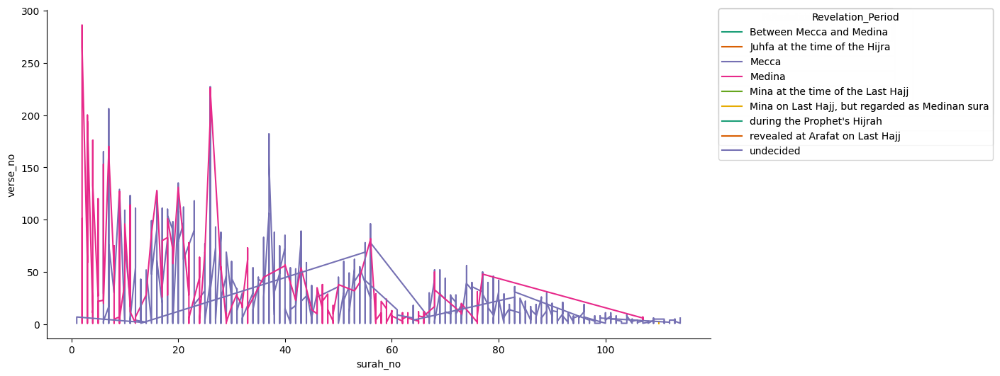

In [ ]:
# @title surah_no vs verse_no

# from matplotlib import pyplot as plt
# import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['surah_no']
  ys = series['verse_no']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = quran_df.sort_values('surah_no', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Revelation_Period')):
  _plot_series(series, series_name, i)
  fig.legend(title='Revelation_Period', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('surah_no')
_ = plt.ylabel('verse_no')

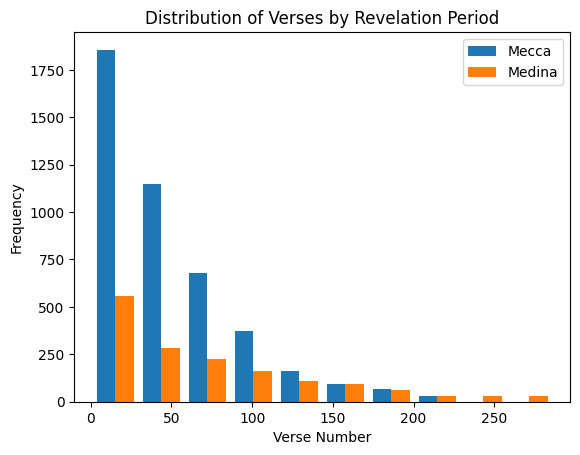

In [ ]:
# @title Distribution of Verses by Revelation Period

# import matplotlib.pyplot as plt

mecca_verses = quran_df[quran_df['Revelation_Period'] == 'Mecca']['verse_no']
medina_verses = quran_df[quran_df['Revelation_Period'] == 'Medina']['verse_no']

plt.hist([mecca_verses, medina_verses], label=['Mecca', 'Medina'])
plt.xlabel('Verse Number')
plt.ylabel('Frequency')
plt.title('Distribution of Verses by Revelation Period')
_ = plt.legend()

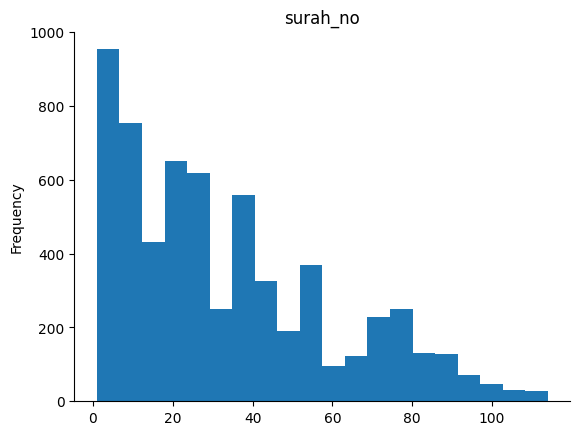

In [ ]:
# @title surah_no

# from matplotlib import pyplot as plt
quran_df['surah_no'].plot(kind='hist', bins=20, title='surah_no')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
model = SentenceTransformer('sentence-transformers/paraphrase-mpnet-base-v2') # replace the model name with any other sentence-transformers model

In [ ]:
def preprocess(sentence):
  """
    add preprocessing action as needed
  """
  return sentence.lower()

def transform_label(label):
  cor_label_names = {
      "Mecca" : 0,
      "Medina" : 1
  }
  return cor_label_names.get(label, None)

  topk = 1
def getMostProbablePred(df, simSentences, threshold = 0.4):
  predictions = []
  bestScorePerClass = dict()
  for x in simSentences:
    if x['score'] < threshold:
      return None
    pred = df['Revelation_Period'][x['corpus_id']]
    predictions.append(pred)
    if pred in bestScorePerClass:
      if bestScorePerClass[pred] < x['score']:
        bestScorePerClass[pred] = x['score']
    else:
      bestScorePerClass[pred] = x['score']
  counts = Counter(predictions)
  most_probable_pred, _ = counts.most_common(1)[0]
  return most_probable_pred, bestScorePerClass[most_probable_pred]

In [ ]:
quran_embeddings = model.encode([preprocess(quran_df['english_translation'][index]) for index in quran_df.index], convert_to_tensor=True, show_progress_bar=True)

Batches:   0%|          | 0/195 [00:00<?, ?it/s]

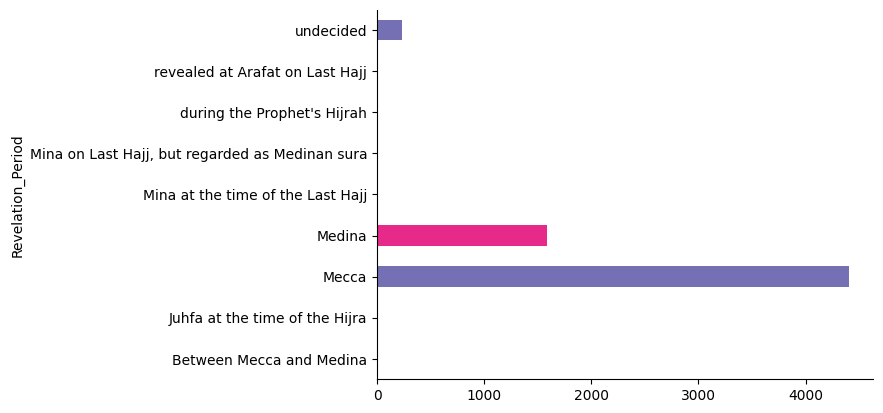

In [ ]:
#revelation_period
# from matplotlib import pyplot as plt
# import seaborn as sns
quran_df.groupby('Revelation_Period').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
def predict_label(sentence, threshold=0.4):
  """
    Retrieves the most similar verse to the given sentence and returns it if the cosine-similarity
    between the sentence and the retrieved verse is more than the given threshold, else returns None
  """
  sentence_embedding = model.encode([sentence], convert_to_tensor=True, show_progress_bar=False)
  most_similar = util.semantic_search(sentence_embedding, quran_embeddings, top_k=topk)[0][0]
  if most_similar['score'] <= threshold:
    return None

In [ ]:
# import pandas as pd
# from tabulate import tabulate

# Load the Excel file
df = pd.read_excel(quran_file_path)
df['english_translation'] = df['english_translation'].apply(lambda x: x[:50] + '...' if len(x) > 50 else x)

df['Revelation_Period'] = df['Revelation_Period'].apply(lambda x: x[:50] + '...' if len(x) > 50 else x)
# Display the entire DataFrame as a table
print(tabulate(df, headers='keys', tablefmt='grid'))




+------+------------+------------+-------------------------------------------------------+-------------------------------------------------+
|      |   surah_no |   verse_no | english_translation                                   | Revelation_Period                               |
+======+============+============+=======================================================+=================================================+
|    0 |          1 |          1 | In the Name of Allah- the Most Compassionate, Most... | undecided                                       |
+------+------------+------------+-------------------------------------------------------+-------------------------------------------------+
|    1 |          1 |          2 | All praise is for Allah- Lord of all worlds,          | undecided                                       |
+------+------------+------------+-------------------------------------------------------+-------------------------------------------------+
|    2 |     

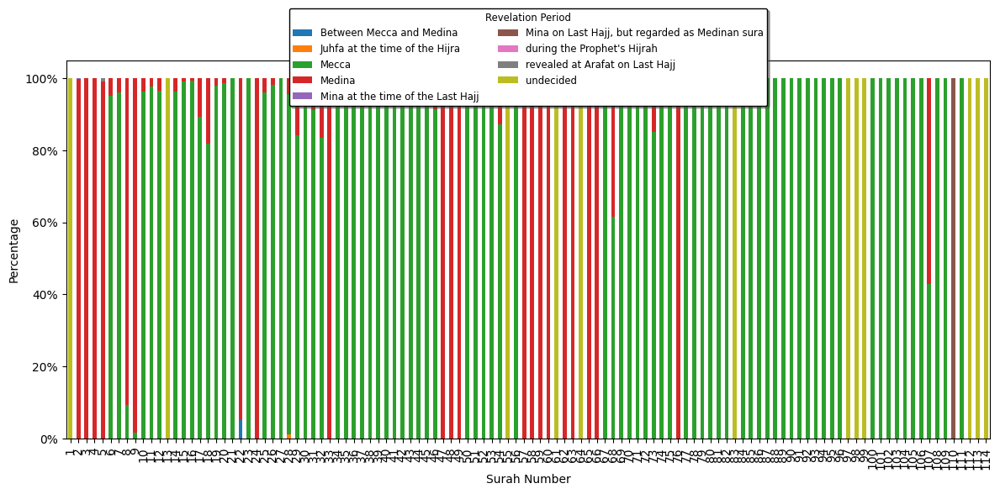

In [ ]:
# import matplotlib.pyplot as plt
# from matplotlib.ticker import PercentFormatter

# Ensure 'surah_no' is numeric
df['surah_no'] = pd.to_numeric(df['surah_no'], errors='coerce')

# Group by 'surah_no' and calculate the percentage of Meccan and Medinan verses
surahStat = df.groupby('surah_no')['Revelation_Period'].value_counts(normalize=True).unstack().fillna(0) * 100

# Sort the data by 'surah_no'
surahStat = surahStat.sort_index()

# Plotting the stacked bar chart
ax = surahStat.plot(kind='bar', stacked=True, figsize=(12, 6))

# Customize the plot
ax.set_title(None)  # Remove the title
ax.legend(
    title='Revelation Period',
    loc='upper center',
    bbox_to_anchor=(0.5, 1.15),
    ncol=2,
    fancybox=True,
    shadow=True,
    fontsize='small',
    title_fontsize='small',
    edgecolor='black',
    frameon=True
)
ax.set_xlabel('Surah Number')
ax.set_ylabel('Percentage')

# Format the y-axis to display percentages
ax.yaxis.set_major_formatter(PercentFormatter())

# Customize x-ticks
plt.xticks(rotation=90)
plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
verse_numbers = df['verse_no'].tolist()

Paragraphing in dataset Valley Came Alive

In [ ]:
# import re
# import os

# Function to clean the text
def clean_text(text):
    # Remove extra spaces between words within paragraphs
    text = re.sub(r'[ ]{2,}', ' ', text)  # Replace multiple spaces with a single space

    # Remove line breaks within paragraphs to form complete lines
    text = re.sub(r'(?<!\n)\n(?!\n)', ' ', text)  # Merge lines within paragraphs

    # Ensure paragraphs are separated by two newlines
    text = re.sub(r'\n{2,}', '\n\n', text)  # Ensure double newlines between paragraphs

    return text

# Function to process all text files in a folder
def process_text_files(input_folder, output_folder):
    # Ensure output folder exists
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Loop through all text files in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith('.txt'):  # Process only .txt files
            file_path = os.path.join(input_folder, filename)

            # Read and clean the text
            with open(file_path, 'r', encoding='utf-8') as file:
                raw_text = file.read()
            cleaned_text = clean_text(raw_text)

            # Save the cleaned text to the output folder
            output_file_path = os.path.join(output_folder, filename)  # Save with the same filename
            with open(output_file_path, 'w', encoding='utf-8') as output_file:
                output_file.write(cleaned_text)

            print(f"Processed and saved: {output_file_path}")

# Specify the input folder containing the text files
input_folder = '/content/drive/MyDrive/CSE498R/The Valley Came Alive'  # Replace with the folder path containing your 20-25 text files

# Specify the output folder to save the cleaned text files
output_folder = '/content/drive/MyDrive/CSE498R/The Valley Came Alive'  # Replace with your desired output folder

# Process all text files in the folder
process_text_files(input_folder, output_folder)

print(f"All files processed and saved in {output_folder}")


All files processed and saved in /content/drive/MyDrive/CSE498R/The Valley Came Alive


Reading out The Valley came alive (Mecca Part)

In [ ]:
# import os
# import re

# Function to clean the text and close spacing within paragraphs
def clean_text(text):
    # Remove extra spaces between words in each line
    text = re.sub(r'[ ]{2,}', ' ', text)  # Replace multiple spaces with a single space

    # Close line spacing within paragraphs but keep paragraph separation
    # Remove line breaks within paragraphs (merge lines into continuous paragraphs)
    text = re.sub(r'(?<!\n)\n(?!\n)', ' ', text)

    # Ensure paragraphs are separated by two newlines
    text = re.sub(r'\n{2,}', '\n\n', text)  # Ensure double newlines between paragraphs

    return text

# Path to the Makka folder (update this with your actual path)
mecca_folder_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Mecca'  # Replace with your actual folder path

# Function to load biographies from a folder with numbering and close line spacing
def load_biographies_from_folder(folder_path):
    biographies = {}
    for i, filename in enumerate(sorted(os.listdir(folder_path)), start=1):
        file_path = os.path.join(folder_path, filename)
        if os.path.isfile(file_path):  # Ensure it is a file, not a subdirectory
            with open(file_path, 'r', encoding='utf-8') as file:
                content = file.read().strip()
                if content:
                    biographies[i] = clean_text(content)  # Clean and format the content
    return biographies

# Load the biography texts from the Makka folder and clean them
mecca_biographies = load_biographies_from_folder(mecca_folder_path)

# Print the biographies with numbering and closed line spacing
for number, biography in mecca_biographies.items():
    print(f"Biography {number}:")
    print(biography)
    print("-" * 50)


Biography 1:
Chapter on How the Revelation Began to Come to the Messenger of Allah And Mention of the First Thing Revealed to Him From the Qur’an Al-Bukhari narrated on the authority of ‘A’ishah, may Allah be pleased with her, that she said, “The commencement of the Divine Inspiration to Allah’s Messenger, Peace and Blessings of Allah be upon him, was in the form of good dreams which came true like broad daylight, and then the love of seclusion was bestowed upon him. He used to go in seclusion to the Cave of Hira’ where he used to worship (Allah, the Almighty, Alone) continuously for many days before his desire to see his family overcame him. He used to take food with him on the journey, for the stay and then would come back to (his wife) Khadeejah, may Allah be pleased with her, to take more food supplies, until suddenly the Truth descended upon him while he was in the Cave of Hira’. The angel came to him and asked him to read. He replied: 'I do not know how to read.' The Prophet said

In [ ]:
# Save the output to a text file
output_file_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Mecca/Mecca-1.txt'  # Update with your desired path
with open(output_file_path, 'w', encoding='utf-8') as output_file:
    for number, biography in mecca_biographies.items():
        output_file.write(f"Biography {number}:\n")
        output_file.write(biography + "\n")
        output_file.write("-" * 50 + "\n")

print(f"Biographies have been saved to {output_file_path}")

Biographies have been saved to /content/drive/MyDrive/CSE498R/The Valley Came Alive/Mecca/Mecca-1.txt


Reading out The Valley came alive (Madina Part)

In [ ]:
# import os
# import re

# Function to clean the text and close spacing within paragraphs
def clean_text(text):
    # Remove extra spaces between words in each line
    text = re.sub(r'[ ]{2,}', ' ', text) # Replace multiple spaces with a single space

    # Close line spacing within paragraphs but keep paragraph separation
    # Remove line breaks within paragraphs (merge lines into continuous paragraphs)
    text = re.sub(r'(?<!\n)\n(?!\n)', ' ', text)

    # Ensure paragraphs are separated by two newlines
    text = re.sub(r'\n{2,}', '\n\n', text)  # Ensure double newlines between paragraphs

    return text

# Path to the Madina folder (update this with your actual path)
medina_folder_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Medina'  # Replace with your actual folder path

# Function to load biographies from a folder with numbering and close line spacing
def load_biographies_from_folder(folder_path):
    biographies = {}
    for i, filename in enumerate(sorted(os.listdir(folder_path)), start=1):
        file_path = os.path.join(folder_path, filename)
        if os.path.isfile(file_path):  # Ensure it is a file, not a subdirectory
            with open(file_path, 'r', encoding='utf-8') as file:
                content = file.read().strip()
                if content:
                    biographies[i] = clean_text(content)  # Clean and format the content
    return biographies

# Load the biography texts from the Makka folder and clean them
medina_biographies = load_biographies_from_folder(medina_folder_path)

# Print the biographies with numbering and closed line spacing
for number, biography in medina_biographies.items():
    print(f"Biography {number}:")
    print(biography)
    print("-" * 50)



Biography 1:
Migration of Allah’s Messenger from Makkah to Madinah along with Abu Bakr As-Siddiq Al-Bukhari related from Ibn ‘Abbas that: Allah’s Messenger started receiving the Divine Revelation at the age of forty. Then he stayed in Makkah for thirteen years, receiving the Divine Revelation. Then he was ordered to migrate and he lived as an Emigrant for ten years and then died at the age of sixty-three (years).”

Ibn Ishaq related that when Abu Bakr requested the permission of Allah’s Messenger, peace and blessings of Allah be upon him, to migrate, he told him: “Don’t be in haste, perhaps Allah will grant you a companion.” Abu Bakr hoped the Messenger of Allah was referring to himself. So he bought two camels, tied them in his house and fed them in preparation for that purpose.

Ibn Ishaq related that it has been narrated to me from ‘Urwah Ibn AzZubair that ‘A’ishah, the Mother of the Believers, said: Allah’s Messenger never used to come to the house of Abu Bakr at any time of the da

In [ ]:
# Save the output to a text file
output_file_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Medina/Medina-1.txt'  # Update with your desired path
with open(output_file_path, 'w', encoding='utf-8') as output_file:
    for number, biography in medina_biographies.items():
        output_file.write(f"Biography {number}:\n")
        output_file.write(biography + "\n")
        output_file.write("-" * 50 + "\n")

print(f"Biographies have been saved to {output_file_path}")

Biographies have been saved to /content/drive/MyDrive/CSE498R/The Valley Came Alive/Medina/Medina-1.txt


**DATA FRAME  **1** **

In [ ]:
# import pandas as pd

# Load the Quran dataset
file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'  # Update this with your dataset path
quran_df = pd.read_excel(file_path)

# Function to create frame paragraphs with revelation period for a specified window size
def create_frame_paragraphs_with_period(df, window_size=1):
    result = []

    # Iterate through each surah from 1 to 114
    for surah_no in range(1, 115):
        # Filter the DataFrame for the current surah_no
        group = df[df['surah_no'] == surah_no]

        if not group.empty:
            group = group.sort_values(by='verse_no')  # Ensure verses are sorted by verse_no

            # Get the verses, verse numbers, and revelation period for the current surah
            verses = group['english_translation'].tolist()
            verse_numbers = group['verse_no'].tolist()
            revelation_periods = group['Revelation_Period'].tolist()

            # Create sliding window paragraphs based on the specified window size
            for i in range(len(verses) - (window_size - 1)):
                # Combine verses according to the window size into a paragraph
                paragraph = ' '.join(verses[i:i + window_size])
                verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"

                # Determine the revelation period for the current range
                period_window = revelation_periods[i:i + window_size]
                if all(period == period_window[0] for period in period_window):
                    Revelation_Period = period_window[0]  # Consistent period (either Makka or Medina)
                else:
                    Revelation_Period = "Mixed"  # Mixed revelation periods

                result.append({
                    'Surah No': surah_no,
                    'Verse Range': verse_range,
                    'Paragraph': paragraph,
                    'Revelation Period': Revelation_Period
                })

    return result

# Specify the window size here (e.g., 2 for 1,2,3,4,5,6..)
window_size = 1  # Adjust this value as needed

# Generate frame paragraphs with revelation period using the specified window size
paragraphs_by_surah = create_frame_paragraphs_with_period(quran_df, window_size)

# Convert the results to a DataFrame
results_df = pd.DataFrame(paragraphs_by_surah)

# Save the DataFrame to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/D1 (1-2,2-3...and so on)(1).xlsx'  # Update this with your desired output path
results_df.to_excel(output_file_path, index=False)

print(f"Results saved to {output_file_path}")

Results saved to /content/drive/MyDrive/CSE498R/D1 (1-2,2-3...and so on)(1).xlsx


In [ ]:
# import os
# import pandas as pd
# from sentence_transformers import SentenceTransformer, util
# import re

# # Load the Quran dataset
# quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset.xlsx'
# quran_df = pd.read_excel(quran_file_path)

# # Load the biography datasets (Mecca and Medina)
# biography_makka_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Mecca/Mecca-1.txt'
# biography_medina_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Medina/Medina-1.txt'

# # Load biography files as DataFrame
# biography_makka_df = pd.read_csv(biography_makka_path, sep='\t', header=None, names=['paragraph'])
# biography_medina_df = pd.read_csv(biography_medina_path, sep='\t', header=None, names=['paragraph'])

# Reset the index to a simple RangeIndex before adding 1
biography_makka_df = biography_makka_df.reset_index(drop=True)
biography_medina_df = biography_medina_df.reset_index(drop=True)

# Add 'Biography Number' to identify paragraphs
biography_makka_df['Biography No'] = biography_makka_df.index + 1
biography_medina_df['Biography No'] = biography_medina_df.index + 1

# Combine the biography datasets into a single DataFrame with a 'Revelation_Period' column
biography_makka_df['Revelation_Period'] = 'Mecca'
biography_medina_df['Revelation_Period'] = 'Medina'
biography_df = pd.concat([biography_makka_df, biography_medina_df], ignore_index=True)

# Add Biography Name (Source file name for each biography)
biography_df['Biography Name'] = biography_df.apply(
    lambda row: f"{row['Revelation_Period']} Biography {row['Biography No']}", axis=1)

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Function to infer relationship based on keywords in both verse and best match line
def infer_relationship(verse, biography_line):
    if 'battle' in verse.lower() or 'battle' in biography_line.lower():
        return 'Historical Context (Battle)'
    elif 'believe' in verse.lower() or 'faith' in biography_line.lower():
        return 'Spiritual Guidance'
    elif 'prophet' in verse.lower() or 'messenger' in biography_line.lower():
        return 'Prophetic Actions'
    elif 'law' in verse.lower() or 'command' in biography_line.lower():
        return 'Legal/Instructional'
    elif 'community' in verse.lower() or 'ummah' in biography_line.lower():
        return 'Community Impact'
    else:
        return 'General Contextual Relationship'

# Function to clean text for Excel compatibility
def clean_text_for_excel(text):
    return re.sub(r'[\x00-\x09\x0b-\x1f\x7f-\x9f]', '', text)

# Function for enhanced similarity and prediction
def find_best_similarity_with_biography(quran_df, biography_df, window_size=1, threshold=0.4, top_n=5):
    results = []

    surah_numbers = quran_df['surah_no'].tolist()
    verse_numbers = quran_df['verse_no'].tolist()
    verses = quran_df['english_translation'].tolist()
    periods = quran_df['Revelation_Period'].tolist()

    verse_embeddings = model.encode(verses, convert_to_tensor=True)
    biography_texts = biography_df['paragraph'].tolist()
    biography_periods = biography_df['Revelation_Period'].tolist()
    biography_lines = biography_df['Biography No'].tolist()
    biography_names = biography_df['Biography Name'].tolist()  # Added Biography Name
    biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

    # Track source file names for Mecca and Medina
    biography_files = {
        'Mecca': biography_makka_path.split('/')[-1],  # Extract file name from path
        'Medina': biography_medina_path.split('/')[-1]  # Extract file name from path
    }

    for i in range(len(verses) - window_size + 1):
        verse_frame = ' '.join(verses[i:i + window_size])
        verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"
        actual_period = periods[i]

        frame_embedding = model.encode(verse_frame, convert_to_tensor=True)
        similarity_scores = util.pytorch_cos_sim(frame_embedding, biography_embeddings)[0]

        top_indices = similarity_scores.topk(top_n).indices
        top_scores = similarity_scores[top_indices].tolist()

        # Determine predicted period based on similarity scores
        mecca_score, medina_score = 0, 0
        for idx, score in zip(top_indices, top_scores):
            if score < threshold:
                continue
            if biography_periods[idx] == 'Mecca':
                mecca_score += score
            else:
                medina_score += score

        # Determine predicted period
        if mecca_score > medina_score:
            predicted_period = 'Mecca'
        elif medina_score > mecca_score:
            predicted_period = 'Medina'
        else:
            predicted_period = 'Uncertain'

        # Get best match biography line and its properties
        best_match_idx = top_indices[0].item()
        best_match_line = biography_texts[best_match_idx]
        best_match_score = top_scores[0]
        assigned_biography = biography_periods[best_match_idx]
        best_biography_line = biography_lines[best_match_idx]  # Get biography line number
        best_biography_name = biography_files[biography_periods[best_match_idx]]  # Get biography file name

        # Infer the relationship between the verse and biography
        relationship = infer_relationship(verse_frame, best_match_line)

        # Append results with Biography Name based on best match file
        results.append({
            'Surah No': surah_numbers[i],
            'Verse Range': verse_range,
            'Verse (as Window Frame)': clean_text_for_excel(verse_frame),
            'Actual Period': actual_period,
            'Predicted Period': predicted_period,
            'Best Match Line': clean_text_for_excel(best_match_line),
            'Best Match Score (as percentage)': round(best_match_score * 100, 2),
            'Assigned Biography': assigned_biography,
            'Biography line no': best_biography_line,
            'Biography Name': best_biography_name,  # Added Biography Name from the source file
            'Relationship': relationship
        })

    return results

# Generate the similarity results with improved accuracy
similarity_results = find_best_similarity_with_biography(quran_df, biography_df)
results_df = pd.DataFrame(similarity_results)

# Save results to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/DFM1.xlsx'
results_df.to_excel(output_file_path, index=False)

print(f"Optimized similarity results saved to {output_file_path}")

Optimized similarity results saved to /content/drive/MyDrive/CSE498R/DFM1.xlsx


**DATA FRAME  **2** **

In [ ]:
# import pandas as pd

# Load the Quran dataset
file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'  # Update this with your dataset path
quran_df = pd.read_excel(file_path)

# Function to create frame paragraphs with revelation period for a specified window size
def create_frame_paragraphs_with_period(df, window_size=2):
    result = []

    # Iterate through each surah from 1 to 114
    for surah_no in range(1, 115):
        # Filter the DataFrame for the current surah_no
        group = df[df['surah_no'] == surah_no]

        if not group.empty:
            group = group.sort_values(by='verse_no')  # Ensure verses are sorted by verse_no

            # Get the verses, verse numbers, and revelation period for the current surah
            verses = group['english_translation'].tolist()
            verse_numbers = group['verse_no'].tolist()
            revelation_periods = group['Revelation_Period'].tolist()

            # Create sliding window paragraphs based on the specified window size
            for i in range(len(verses) - (window_size - 1)):
                # Combine verses according to the window size into a paragraph
                paragraph = ' '.join(verses[i:i + window_size])
                verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"

                # Determine the revelation period for the current range
                period_window = revelation_periods[i:i + window_size]
                if all(period == period_window[0] for period in period_window):
                    Revelation_Period = period_window[0]  # Consistent period (either Makka or Medina)
                else:
                    Revelation_Period = "Mixed"  # Mixed revelation periods

                result.append({
                    'Surah No': surah_no,
                    'Verse Range': verse_range,
                    'Paragraph': paragraph,
                    'Revelation Period': Revelation_Period
                })

    return result

# Specify the window size here (e.g., 2 for 1,2,3,4,5,6..)
window_size = 2  # Adjust this value as needed

# Generate frame paragraphs with revelation period using the specified window size
paragraphs_by_surah = create_frame_paragraphs_with_period(quran_df, window_size)

# Convert the results to a DataFrame
results_df = pd.DataFrame(paragraphs_by_surah)

# Save the DataFrame to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/D2 (1-3,2-4 and so on)(2).xlsx'  # Update this with your desired output path
results_df.to_excel(output_file_path, index=False)

print(f"Results saved to {output_file_path}")

Results saved to /content/drive/MyDrive/CSE498R/D2 (1-3,2-4 and so on)(2).xlsx


In [ ]:
# import os
# import pandas as pd
# from sentence_transformers import SentenceTransformer, util
# import re

# # Load the Quran dataset
# quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset.xlsx'
# quran_df = pd.read_excel(quran_file_path)

# # Load the biography datasets (Mecca and Medina)
# biography_makka_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Mecca/Mecca-1.txt'
# biography_medina_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Medina/Medina-1.txt'

# # Load biography files as DataFrame
# biography_makka_df = pd.read_csv(biography_makka_path, sep='\t', header=None, names=['paragraph'])
# biography_medina_df = pd.read_csv(biography_medina_path, sep='\t', header=None, names=['paragraph'])


# Reset the index to a simple RangeIndex before adding 1
biography_makka_df = biography_makka_df.reset_index(drop=True)
biography_medina_df = biography_medina_df.reset_index(drop=True)

# Add 'Biography Number' to identify paragraphs
biography_makka_df['Biography No'] = biography_makka_df.index + 1
biography_medina_df['Biography No'] = biography_medina_df.index + 1

# Combine the biography datasets into a single DataFrame with a 'Revelation_Period' column
biography_makka_df['Revelation_Period'] = 'Mecca'
biography_medina_df['Revelation_Period'] = 'Medina'
biography_df = pd.concat([biography_makka_df, biography_medina_df], ignore_index=True)

# Add Biography Name (Source file name for each biography)
biography_df['Biography Name'] = biography_df.apply(
    lambda row: f"{row['Revelation_Period']} Biography {row['Biography No']}", axis=1)

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Function to infer relationship based on keywords in both verse and best match line
def infer_relationship(verse, biography_line):
    if 'battle' in verse.lower() or 'battle' in biography_line.lower():
        return 'Historical Context (Battle)'
    elif 'believe' in verse.lower() or 'faith' in biography_line.lower():
        return 'Spiritual Guidance'
    elif 'prophet' in verse.lower() or 'messenger' in biography_line.lower():
        return 'Prophetic Actions'
    elif 'law' in verse.lower() or 'command' in biography_line.lower():
        return 'Legal/Instructional'
    elif 'community' in verse.lower() or 'ummah' in biography_line.lower():
        return 'Community Impact'
    else:
        return 'General Contextual Relationship'

# Function to clean text for Excel compatibility
def clean_text_for_excel(text):
    return re.sub(r'[\x00-\x09\x0b-\x1f\x7f-\x9f]', '', text)

# Function for enhanced similarity and prediction
def find_best_similarity_with_biography(quran_df, biography_df, window_size=2, threshold=0.4, top_n=5):
    results = []

    surah_numbers = quran_df['surah_no'].tolist()
    verse_numbers = quran_df['verse_no'].tolist()
    verses = quran_df['english_translation'].tolist()
    periods = quran_df['Revelation_Period'].tolist()

    verse_embeddings = model.encode(verses, convert_to_tensor=True)
    biography_texts = biography_df['paragraph'].tolist()
    biography_periods = biography_df['Revelation_Period'].tolist()
    biography_lines = biography_df['Biography No'].tolist()
    biography_names = biography_df['Biography Name'].tolist()  # Added Biography Name
    biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

    # Track source file names for Mecca and Medina
    biography_files = {
        'Mecca': biography_makka_path.split('/')[-1],  # Extract file name from path
        'Medina': biography_medina_path.split('/')[-1]  # Extract file name from path
    }

    for i in range(len(verses) - window_size + 1):
        verse_frame = ' '.join(verses[i:i + window_size])
        verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"
        actual_period = periods[i]

        frame_embedding = model.encode(verse_frame, convert_to_tensor=True)
        similarity_scores = util.pytorch_cos_sim(frame_embedding, biography_embeddings)[0]

        top_indices = similarity_scores.topk(top_n).indices
        top_scores = similarity_scores[top_indices].tolist()

        # Determine predicted period based on similarity scores
        mecca_score, medina_score = 0, 0
        for idx, score in zip(top_indices, top_scores):
            if score < threshold:
                continue
            if biography_periods[idx] == 'Mecca':
                mecca_score += score
            else:
                medina_score += score

        # Determine predicted period
        if mecca_score > medina_score:
            predicted_period = 'Mecca'
        elif medina_score > mecca_score:
            predicted_period = 'Medina'
        else:
            predicted_period = 'Uncertain'

        # Get best match biography line and its properties
        best_match_idx = top_indices[0].item()
        best_match_line = biography_texts[best_match_idx]
        best_match_score = top_scores[0]
        assigned_biography = biography_periods[best_match_idx]
        best_biography_line = biography_lines[best_match_idx]  # Get biography line number
        best_biography_name = biography_files[biography_periods[best_match_idx]]  # Get biography file name

        # Infer the relationship between the verse and biography
        relationship = infer_relationship(verse_frame, best_match_line)

        # Append results with Biography Name based on best match file
        results.append({
            'Surah No': surah_numbers[i],
            'Verse Range': verse_range,
            'Verse (as Window Frame)': clean_text_for_excel(verse_frame),
            'Actual Period': actual_period,
            'Predicted Period': predicted_period,
            'Best Match Line': clean_text_for_excel(best_match_line),
            'Best Match Score (as percentage)': round(best_match_score * 100, 2),
            'Assigned Biography': assigned_biography,
            'Biography line no': best_biography_line,
            'Biography Name': best_biography_name,  # Added Biography Name from the source file
            'Relationship': relationship
        })

    return results

# Generate the similarity results with improved accuracy
similarity_results = find_best_similarity_with_biography(quran_df, biography_df)
results_df = pd.DataFrame(similarity_results)

# Save results to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/DFM2.xlsx'
results_df.to_excel(output_file_path, index=False)

print(f"Optimized similarity results saved to {output_file_path}")

Optimized similarity results saved to /content/drive/MyDrive/CSE498R/DFM2.xlsx


**DATA FRAME  **3** **

In [ ]:
# import pandas as pd

# Load the Quran dataset
file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'  # Update this with your dataset path
quran_df = pd.read_excel(file_path)

# Function to create frame paragraphs with revelation period for a specified window size
def create_frame_paragraphs_with_period(df, window_size=3):
    result = []

    # Iterate through each surah from 1 to 114
    for surah_no in range(1, 115):
        # Filter the DataFrame for the current surah_no
        group = df[df['surah_no'] == surah_no]

        if not group.empty:
            group = group.sort_values(by='verse_no')  # Ensure verses are sorted by verse_no

            # Get the verses, verse numbers, and revelation period for the current surah
            verses = group['english_translation'].tolist()
            verse_numbers = group['verse_no'].tolist()
            revelation_periods = group['Revelation_Period'].tolist()

            # Create sliding window paragraphs based on the specified window size
            for i in range(len(verses) - (window_size - 1)):
                # Combine verses according to the window size into a paragraph
                paragraph = ' '.join(verses[i:i + window_size])
                verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"

                # Determine the revelation period for the current range
                period_window = revelation_periods[i:i + window_size]
                if all(period == period_window[0] for period in period_window):
                    Revelation_Period = period_window[0]  # Consistent period (either Makka or Medina)
                else:
                    Revelation_Period = "Mixed"  # Mixed revelation periods

                result.append({
                    'Surah No': surah_no,
                    'Verse Range': verse_range,
                    'Paragraph': paragraph,
                    'Revelation Period': Revelation_Period
                })

    return result

# Specify the window size here (e.g., 2 for 1,2,3,4,5,6..)
window_size = 3  # Adjust this value as needed

# Generate frame paragraphs with revelation period using the specified window size
paragraphs_by_surah = create_frame_paragraphs_with_period(quran_df, window_size)

# Convert the results to a DataFrame
results_df = pd.DataFrame(paragraphs_by_surah)

# Save the DataFrame to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/D3 (1-4,2-5...and so on)(3).xlsx'  # Update this with your desired output path
results_df.to_excel(output_file_path, index=False)

print(f"Results saved to {output_file_path}")

Results saved to /content/drive/MyDrive/CSE498R/D3 (1-4,2-5...and so on)(3).xlsx


In [ ]:
# import os
# import pandas as pd
# from sentence_transformers import SentenceTransformer, util
# import re

# # Load the Quran dataset
# quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset.xlsx'
# quran_df = pd.read_excel(quran_file_path)

# # Load the biography datasets (Mecca and Medina)
# biography_makka_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Mecca/Mecca-1.txt'
# biography_medina_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Medina/Medina-1.txt'

# # Load biography files as DataFrame
# biography_makka_df = pd.read_csv(biography_makka_path, sep='\t', header=None, names=['paragraph'])
# biography_medina_df = pd.read_csv(biography_medina_path, sep='\t', header=None, names=['paragraph'])


# Reset the index to a simple RangeIndex before adding 1
biography_makka_df = biography_makka_df.reset_index(drop=True)
biography_medina_df = biography_medina_df.reset_index(drop=True)

# Add 'Biography Number' to identify paragraphs
biography_makka_df['Biography No'] = biography_makka_df.index + 1
biography_medina_df['Biography No'] = biography_medina_df.index + 1

# Combine the biography datasets into a single DataFrame with a 'Revelation_Period' column
biography_makka_df['Revelation_Period'] = 'Mecca'
biography_medina_df['Revelation_Period'] = 'Medina'
biography_df = pd.concat([biography_makka_df, biography_medina_df], ignore_index=True)

# Add Biography Name (Source file name for each biography)
biography_df['Biography Name'] = biography_df.apply(
    lambda row: f"{row['Revelation_Period']} Biography {row['Biography No']}", axis=1)

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Function to infer relationship based on keywords in both verse and best match line
def infer_relationship(verse, biography_line):
    if 'battle' in verse.lower() or 'battle' in biography_line.lower():
        return 'Historical Context (Battle)'
    elif 'believe' in verse.lower() or 'faith' in biography_line.lower():
        return 'Spiritual Guidance'
    elif 'prophet' in verse.lower() or 'messenger' in biography_line.lower():
        return 'Prophetic Actions'
    elif 'law' in verse.lower() or 'command' in biography_line.lower():
        return 'Legal/Instructional'
    elif 'community' in verse.lower() or 'ummah' in biography_line.lower():
        return 'Community Impact'
    else:
        return 'General Contextual Relationship'

# Function to clean text for Excel compatibility
def clean_text_for_excel(text):
    return re.sub(r'[\x00-\x09\x0b-\x1f\x7f-\x9f]', '', text)

# Function for enhanced similarity and prediction
def find_best_similarity_with_biography(quran_df, biography_df, window_size=3, threshold=0.4, top_n=5):
    results = []

    surah_numbers = quran_df['surah_no'].tolist()
    verse_numbers = quran_df['verse_no'].tolist()
    verses = quran_df['english_translation'].tolist()
    periods = quran_df['Revelation_Period'].tolist()

    verse_embeddings = model.encode(verses, convert_to_tensor=True)
    biography_texts = biography_df['paragraph'].tolist()
    biography_periods = biography_df['Revelation_Period'].tolist()
    biography_lines = biography_df['Biography No'].tolist()
    biography_names = biography_df['Biography Name'].tolist()  # Added Biography Name
    biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

    # Track source file names for Mecca and Medina
    biography_files = {
        'Mecca': biography_makka_path.split('/')[-1],  # Extract file name from path
        'Medina': biography_medina_path.split('/')[-1]  # Extract file name from path
    }

    for i in range(len(verses) - window_size + 1):
        verse_frame = ' '.join(verses[i:i + window_size])
        verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"
        actual_period = periods[i]

        frame_embedding = model.encode(verse_frame, convert_to_tensor=True)
        similarity_scores = util.pytorch_cos_sim(frame_embedding, biography_embeddings)[0]

        top_indices = similarity_scores.topk(top_n).indices
        top_scores = similarity_scores[top_indices].tolist()

        # Determine predicted period based on similarity scores
        mecca_score, medina_score = 0, 0
        for idx, score in zip(top_indices, top_scores):
            if score < threshold:
                continue
            if biography_periods[idx] == 'Mecca':
                mecca_score += score
            else:
                medina_score += score

        # Determine predicted period
        if mecca_score > medina_score:
            predicted_period = 'Mecca'
        elif medina_score > mecca_score:
            predicted_period = 'Medina'
        else:
            predicted_period = 'Uncertain'

        # Get best match biography line and its properties
        best_match_idx = top_indices[0].item()
        best_match_line = biography_texts[best_match_idx]
        best_match_score = top_scores[0]
        assigned_biography = biography_periods[best_match_idx]
        best_biography_line = biography_lines[best_match_idx]  # Get biography line number
        best_biography_name = biography_files[biography_periods[best_match_idx]]  # Get biography file name

        # Infer the relationship between the verse and biography
        relationship = infer_relationship(verse_frame, best_match_line)

        # Append results with Biography Name based on best match file
        results.append({
            'Surah No': surah_numbers[i],
            'Verse Range': verse_range,
            'Verse (as Window Frame)': clean_text_for_excel(verse_frame),
            'Actual Period': actual_period,
            'Predicted Period': predicted_period,
            'Best Match Line': clean_text_for_excel(best_match_line),
            'Best Match Score (as percentage)': round(best_match_score * 100, 2),
            'Assigned Biography': assigned_biography,
            'Biography line no': best_biography_line,
            'Biography Name': best_biography_name,  # Added Biography Name from the source file
            'Relationship': relationship
        })

    return results

# Generate the similarity results with improved accuracy
similarity_results = find_best_similarity_with_biography(quran_df, biography_df)
results_df = pd.DataFrame(similarity_results)

# Save results to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/DFM3.xlsx'
results_df.to_excel(output_file_path, index=False)

print(f"Optimized similarity results saved to {output_file_path}")

Optimized similarity results saved to /content/drive/MyDrive/CSE498R/DFM3.xlsx


**DATA FRAME  **4** **

In [ ]:
# import pandas as pd

# Load the Quran dataset
file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'  # Update this with your dataset path
quran_df = pd.read_excel(file_path)

# Function to create frame paragraphs with revelation period for a specified window size
def create_frame_paragraphs_with_period(df, window_size=4):
    result = []

    # Iterate through each surah from 1 to 114
    for surah_no in range(1, 115):
        # Filter the DataFrame for the current surah_no
        group = df[df['surah_no'] == surah_no]

        if not group.empty:
            group = group.sort_values(by='verse_no')  # Ensure verses are sorted by verse_no

            # Get the verses, verse numbers, and revelation period for the current surah
            verses = group['english_translation'].tolist()
            verse_numbers = group['verse_no'].tolist()
            revelation_periods = group['Revelation_Period'].tolist()

            # Create sliding window paragraphs based on the specified window size
            for i in range(len(verses) - (window_size - 1)):
                # Combine verses according to the window size into a paragraph
                paragraph = ' '.join(verses[i:i + window_size])
                verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"

                # Determine the revelation period for the current range
                period_window = revelation_periods[i:i + window_size]
                if all(period == period_window[0] for period in period_window):
                    Revelation_Period = period_window[0]  # Consistent period (either Makka or Medina)
                else:
                    Revelation_Period = "Mixed"  # Mixed revelation periods

                result.append({
                    'Surah No': surah_no,
                    'Verse Range': verse_range,
                    'Paragraph': paragraph,
                    'Revelation Period': Revelation_Period
                })

    return result

# Specify the window size here (e.g., 2 for 1,2,3,4,5,6..)
window_size = 4  # Adjust this value as needed

# Generate frame paragraphs with revelation period using the specified window size
paragraphs_by_surah = create_frame_paragraphs_with_period(quran_df, window_size)

# Convert the results to a DataFrame
results_df = pd.DataFrame(paragraphs_by_surah)

# Save the DataFrame to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/D4 (1-5,2-6...and so on)(4).xlsx'  # Update this with your desired output path
results_df.to_excel(output_file_path, index=False)

print(f"Results saved to {output_file_path}")

Results saved to /content/drive/MyDrive/CSE498R/D4 (1-5,2-6...and so on)(4).xlsx


In [ ]:
# import os
# import pandas as pd
# from sentence_transformers import SentenceTransformer, util
# import re

# # Load the Quran dataset
# quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset.xlsx'
# quran_df = pd.read_excel(quran_file_path)

# # Load the biography datasets (Mecca and Medina)
# biography_makka_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Mecca/Mecca-1.txt'
# biography_medina_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Medina/Medina-1.txt'

# # Load biography files as DataFrame
# biography_makka_df = pd.read_csv(biography_makka_path, sep='\t', header=None, names=['paragraph'])
# biography_medina_df = pd.read_csv(biography_medina_path, sep='\t', header=None, names=['paragraph'])


# Reset the index to a simple RangeIndex before adding 1
biography_makka_df = biography_makka_df.reset_index(drop=True)
biography_medina_df = biography_medina_df.reset_index(drop=True)

# Add 'Biography Number' to identify paragraphs
biography_makka_df['Biography No'] = biography_makka_df.index + 1
biography_medina_df['Biography No'] = biography_medina_df.index + 1

# Combine the biography datasets into a single DataFrame with a 'Revelation_Period' column
biography_makka_df['Revelation_Period'] = 'Mecca'
biography_medina_df['Revelation_Period'] = 'Medina'
biography_df = pd.concat([biography_makka_df, biography_medina_df], ignore_index=True)

# Add Biography Name (Source file name for each biography)
biography_df['Biography Name'] = biography_df.apply(
    lambda row: f"{row['Revelation_Period']} Biography {row['Biography No']}", axis=1)

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Function to infer relationship based on keywords in both verse and best match line
def infer_relationship(verse, biography_line):
    if 'battle' in verse.lower() or 'battle' in biography_line.lower():
        return 'Historical Context (Battle)'
    elif 'believe' in verse.lower() or 'faith' in biography_line.lower():
        return 'Spiritual Guidance'
    elif 'prophet' in verse.lower() or 'messenger' in biography_line.lower():
        return 'Prophetic Actions'
    elif 'law' in verse.lower() or 'command' in biography_line.lower():
        return 'Legal/Instructional'
    elif 'community' in verse.lower() or 'ummah' in biography_line.lower():
        return 'Community Impact'
    else:
        return 'General Contextual Relationship'

# Function to clean text for Excel compatibility
def clean_text_for_excel(text):
    return re.sub(r'[\x00-\x09\x0b-\x1f\x7f-\x9f]', '', text)

# Function for enhanced similarity and prediction
def find_best_similarity_with_biography(quran_df, biography_df, window_size=4, threshold=0.4, top_n=5):
    results = []

    surah_numbers = quran_df['surah_no'].tolist()
    verse_numbers = quran_df['verse_no'].tolist()
    verses = quran_df['english_translation'].tolist()
    periods = quran_df['Revelation_Period'].tolist()

    verse_embeddings = model.encode(verses, convert_to_tensor=True)
    biography_texts = biography_df['paragraph'].tolist()
    biography_periods = biography_df['Revelation_Period'].tolist()
    biography_lines = biography_df['Biography No'].tolist()
    biography_names = biography_df['Biography Name'].tolist()  # Added Biography Name
    biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

    # Track source file names for Mecca and Medina
    biography_files = {
        'Mecca': biography_makka_path.split('/')[-1],  # Extract file name from path
        'Medina': biography_medina_path.split('/')[-1]  # Extract file name from path
    }

    for i in range(len(verses) - window_size + 1):
        verse_frame = ' '.join(verses[i:i + window_size])
        verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"
        actual_period = periods[i]

        frame_embedding = model.encode(verse_frame, convert_to_tensor=True)
        similarity_scores = util.pytorch_cos_sim(frame_embedding, biography_embeddings)[0]

        top_indices = similarity_scores.topk(top_n).indices
        top_scores = similarity_scores[top_indices].tolist()

        # Determine predicted period based on similarity scores
        mecca_score, medina_score = 0, 0
        for idx, score in zip(top_indices, top_scores):
            if score < threshold:
                continue
            if biography_periods[idx] == 'Mecca':
                mecca_score += score
            else:
                medina_score += score

        # Determine predicted period
        if mecca_score > medina_score:
            predicted_period = 'Mecca'
        elif medina_score > mecca_score:
            predicted_period = 'Medina'
        else:
            predicted_period = 'Uncertain'

        # Get best match biography line and its properties
        best_match_idx = top_indices[0].item()
        best_match_line = biography_texts[best_match_idx]
        best_match_score = top_scores[0]
        assigned_biography = biography_periods[best_match_idx]
        best_biography_line = biography_lines[best_match_idx]  # Get biography line number
        best_biography_name = biography_files[biography_periods[best_match_idx]]  # Get biography file name

        # Infer the relationship between the verse and biography
        relationship = infer_relationship(verse_frame, best_match_line)

        # Append results with Biography Name based on best match file
        results.append({
            'Surah No': surah_numbers[i],
            'Verse Range': verse_range,
            'Verse (as Window Frame)': clean_text_for_excel(verse_frame),
            'Actual Period': actual_period,
            'Predicted Period': predicted_period,
            'Best Match Line': clean_text_for_excel(best_match_line),
            'Best Match Score (as percentage)': round(best_match_score * 100, 2),
            'Assigned Biography': assigned_biography,
            'Biography line no': best_biography_line,
            'Biography Name': best_biography_name,  # Added Biography Name from the source file
            'Relationship': relationship
        })

    return results

# Generate the similarity results with improved accuracy
similarity_results = find_best_similarity_with_biography(quran_df, biography_df)
results_df = pd.DataFrame(similarity_results)

# Save results to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/DFM4.xlsx'
results_df.to_excel(output_file_path, index=False)

print(f"Optimized similarity results saved to {output_file_path}")

Optimized similarity results saved to /content/drive/MyDrive/CSE498R/DFM4.xlsx


**DATA FRAME  **5** **

In [ ]:
# import pandas as pd

# Load the Quran dataset
file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'  # Update this with your dataset path
quran_df = pd.read_excel(file_path)

# Function to create frame paragraphs with revelation period for a specified window size
def create_frame_paragraphs_with_period(df, window_size=5):
    result = []

    # Iterate through each surah from 1 to 114
    for surah_no in range(1, 115):
        # Filter the DataFrame for the current surah_no
        group = df[df['surah_no'] == surah_no]

        if not group.empty:
            group = group.sort_values(by='verse_no')  # Ensure verses are sorted by verse_no

            # Get the verses, verse numbers, and revelation period for the current surah
            verses = group['english_translation'].tolist()
            verse_numbers = group['verse_no'].tolist()
            revelation_periods = group['Revelation_Period'].tolist()

            # Create sliding window paragraphs based on the specified window size
            for i in range(len(verses) - (window_size - 1)):
                # Combine verses according to the window size into a paragraph
                paragraph = ' '.join(verses[i:i + window_size])
                verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"

                # Determine the revelation period for the current range
                period_window = revelation_periods[i:i + window_size]
                if all(period == period_window[0] for period in period_window):
                    Revelation_Period = period_window[0]  # Consistent period (either Makka or Medina)
                else:
                    Revelation_Period = "Mixed"  # Mixed revelation periods

                result.append({
                    'Surah No': surah_no,
                    'Verse Range': verse_range,
                    'Paragraph': paragraph,
                    'Revelation Period': Revelation_Period
                })

    return result

# Specify the window size here (e.g., 2 for 1,2,3,4,5,6..)
window_size = 5  # Adjust this value as needed

# Generate frame paragraphs with revelation period using the specified window size
paragraphs_by_surah = create_frame_paragraphs_with_period(quran_df, window_size)

# Convert the results to a DataFrame
results_df = pd.DataFrame(paragraphs_by_surah)

# Save the DataFrame to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/D5 (1-6,2-7...and so on)(5).xlsx'  # Update this with your desired output path
results_df.to_excel(output_file_path, index=False)

print(f"Results saved to {output_file_path}")

Results saved to /content/drive/MyDrive/CSE498R/D5 (1-6,2-7...and so on)(5).xlsx


In [ ]:
# import os
# import pandas as pd
# from sentence_transformers import SentenceTransformer, util
# import re

# # Load the Quran dataset
# quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset.xlsx'
# quran_df = pd.read_excel(quran_file_path)

# # Load the biography datasets (Mecca and Medina)
# biography_makka_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Mecca/Mecca-1.txt'
# biography_medina_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Medina/Medina-1.txt'

# # Load biography files as DataFrame
# biography_makka_df = pd.read_csv(biography_makka_path, sep='\t', header=None, names=['paragraph'])
# biography_medina_df = pd.read_csv(biography_medina_path, sep='\t', header=None, names=['paragraph'])


# Reset the index to a simple RangeIndex before adding 1
biography_makka_df = biography_makka_df.reset_index(drop=True)
biography_medina_df = biography_medina_df.reset_index(drop=True)

# Add 'Biography Number' to identify paragraphs
biography_makka_df['Biography No'] = biography_makka_df.index + 1
biography_medina_df['Biography No'] = biography_medina_df.index + 1

# Combine the biography datasets into a single DataFrame with a 'Revelation_Period' column
biography_makka_df['Revelation_Period'] = 'Mecca'
biography_medina_df['Revelation_Period'] = 'Medina'
biography_df = pd.concat([biography_makka_df, biography_medina_df], ignore_index=True)

# Add Biography Name (Source file name for each biography)
biography_df['Biography Name'] = biography_df.apply(
    lambda row: f"{row['Revelation_Period']} Biography {row['Biography No']}", axis=1)

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Function to infer relationship based on keywords in both verse and best match line
def infer_relationship(verse, biography_line):
    if 'battle' in verse.lower() or 'battle' in biography_line.lower():
        return 'Historical Context (Battle)'
    elif 'believe' in verse.lower() or 'faith' in biography_line.lower():
        return 'Spiritual Guidance'
    elif 'prophet' in verse.lower() or 'messenger' in biography_line.lower():
        return 'Prophetic Actions'
    elif 'law' in verse.lower() or 'command' in biography_line.lower():
        return 'Legal/Instructional'
    elif 'community' in verse.lower() or 'ummah' in biography_line.lower():
        return 'Community Impact'
    else:
        return 'General Contextual Relationship'

# Function to clean text for Excel compatibility
def clean_text_for_excel(text):
    return re.sub(r'[\x00-\x09\x0b-\x1f\x7f-\x9f]', '', text)

# Function for enhanced similarity and prediction
def find_best_similarity_with_biography(quran_df, biography_df, window_size=5, threshold=0.4, top_n=5):
    results = []

    surah_numbers = quran_df['surah_no'].tolist()
    verse_numbers = quran_df['verse_no'].tolist()
    verses = quran_df['english_translation'].tolist()
    periods = quran_df['Revelation_Period'].tolist()

    verse_embeddings = model.encode(verses, convert_to_tensor=True)
    biography_texts = biography_df['paragraph'].tolist()
    biography_periods = biography_df['Revelation_Period'].tolist()
    biography_lines = biography_df['Biography No'].tolist()
    biography_names = biography_df['Biography Name'].tolist()  # Added Biography Name
    biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

    # Track source file names for Mecca and Medina
    biography_files = {
        'Mecca': biography_makka_path.split('/')[-1],  # Extract file name from path
        'Medina': biography_medina_path.split('/')[-1]  # Extract file name from path
    }

    for i in range(len(verses) - window_size + 1):
        verse_frame = ' '.join(verses[i:i + window_size])
        verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"
        actual_period = periods[i]

        frame_embedding = model.encode(verse_frame, convert_to_tensor=True)
        similarity_scores = util.pytorch_cos_sim(frame_embedding, biography_embeddings)[0]

        top_indices = similarity_scores.topk(top_n).indices
        top_scores = similarity_scores[top_indices].tolist()

        # Determine predicted period based on similarity scores
        mecca_score, medina_score = 0, 0
        for idx, score in zip(top_indices, top_scores):
            if score < threshold:
                continue
            if biography_periods[idx] == 'Mecca':
                mecca_score += score
            else:
                medina_score += score

        # Determine predicted period
        if mecca_score > medina_score:
            predicted_period = 'Mecca'
        elif medina_score > mecca_score:
            predicted_period = 'Medina'
        else:
            predicted_period = 'Uncertain'

        # Get best match biography line and its properties
        best_match_idx = top_indices[0].item()
        best_match_line = biography_texts[best_match_idx]
        best_match_score = top_scores[0]
        assigned_biography = biography_periods[best_match_idx]
        best_biography_line = biography_lines[best_match_idx]  # Get biography line number
        best_biography_name = biography_files[biography_periods[best_match_idx]]  # Get biography file name

        # Infer the relationship between the verse and biography
        relationship = infer_relationship(verse_frame, best_match_line)

        # Append results with Biography Name based on best match file
        results.append({
            'Surah No': surah_numbers[i],
            'Verse Range': verse_range,
            'Verse (as Window Frame)': clean_text_for_excel(verse_frame),
            'Actual Period': actual_period,
            'Predicted Period': predicted_period,
            'Best Match Line': clean_text_for_excel(best_match_line),
            'Best Match Score (as percentage)': round(best_match_score * 100, 2),
            'Assigned Biography': assigned_biography,
            'Biography line no': best_biography_line,
            'Biography Name': best_biography_name,  # Added Biography Name from the source file
            'Relationship': relationship
        })

    return results

# Generate the similarity results with improved accuracy
similarity_results = find_best_similarity_with_biography(quran_df, biography_df)
results_df = pd.DataFrame(similarity_results)

# Save results to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/DFM5.xlsx'
results_df.to_excel(output_file_path, index=False)

print(f"Optimized similarity results saved to {output_file_path}")

Optimized similarity results saved to /content/drive/MyDrive/CSE498R/DFM5.xlsx


Finding of the Accuracy, Precision, Recall, F1 score

In [ ]:
import pandas as pd
from sklearn.metrics import recall_score, f1_score, accuracy_score

# List of window frames to evaluate
window_frames = ['1-1', '1-2', '1-3', '1-4', '1-5']
file_paths = [
    '/content/drive/MyDrive/CSE498R/DFM1.xlsx',
    '/content/drive/MyDrive/CSE498R/DFM2.xlsx',
    '/content/drive/MyDrive/CSE498R/DFM3.xlsx',
    '/content/drive/MyDrive/CSE498R/DFM4.xlsx',
    '/content/drive/MyDrive/CSE498R/DFM5.xlsx'
]

# Initialize lists to store metrics for Mecca
metrics_data_mecca = []

def compute_metrics_mecca(df):
    """
    Compute accuracy, precision, recall, and F1-score for Mecca predictions.
    """
    # Filter for Mecca only
    actual_mecca = df['Actual Period'] == 'Mecca'
    predicted_mecca = df['Predicted Period'] == 'Mecca'

    # Calculate True Positives (TP), False Positives (FP), False Negatives (FN), and True Negatives (TN)
    true_positive_mecca = (actual_mecca & predicted_mecca).sum()
    false_positive_mecca = (~actual_mecca & predicted_mecca).sum()
    false_negative_mecca = (actual_mecca & ~predicted_mecca).sum()
    true_negative_mecca = (~actual_mecca & ~predicted_mecca).sum()

    # Precision for Mecca based on the custom formula
    precision_mecca = true_positive_mecca / (true_positive_mecca + false_positive_mecca) if (true_positive_mecca + false_positive_mecca) > 0 else 0

    # Recall for Mecca (standard recall formula)
    recall_mecca = recall_score(actual_mecca, predicted_mecca)

    # F1 score for Mecca (standard F1 score formula)
    f1_mecca = f1_score(actual_mecca, predicted_mecca)

    # Accuracy (standard accuracy formula)
    accuracy = accuracy_score(actual_mecca, predicted_mecca)

    return accuracy, precision_mecca, recall_mecca, f1_mecca

# Loop through each window frame and compute metrics for Mecca
for file_path, window_frame in zip(file_paths, window_frames):
    # Load the DataFrame
    df = pd.read_excel(file_path)

    # Calculate metrics for Mecca
    accuracy, precision, recall, f1 = compute_metrics_mecca(df)

    # Append metrics to the list for Mecca
    metrics_data_mecca.append([window_frame, accuracy, precision, recall, f1])

# Create a DataFrame for the metrics for Mecca
metrics_df_mecca = pd.DataFrame(metrics_data_mecca, columns=['Window Frame', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])

# Calculate averages for each metric
averages = metrics_df_mecca[['Accuracy', 'Precision', 'Recall', 'F1 Score']].mean()

# Append the averages as a new row
metrics_df_mecca.loc[len(metrics_df_mecca)] = ['Average', *averages]

# Save the DataFrame to an Excel file
output_file_path_mecca = '/content/drive/MyDrive/CSE498R/metrics_results_for_mecca.xlsx'
metrics_df_mecca.to_excel(output_file_path_mecca, index=False)

# Inform the user that the file has been saved
print(f'Metrics table for Mecca saved to: {output_file_path_mecca}')


Metrics table for Mecca saved to: /content/drive/MyDrive/CSE498R/metrics_results_for_mecca.xlsx


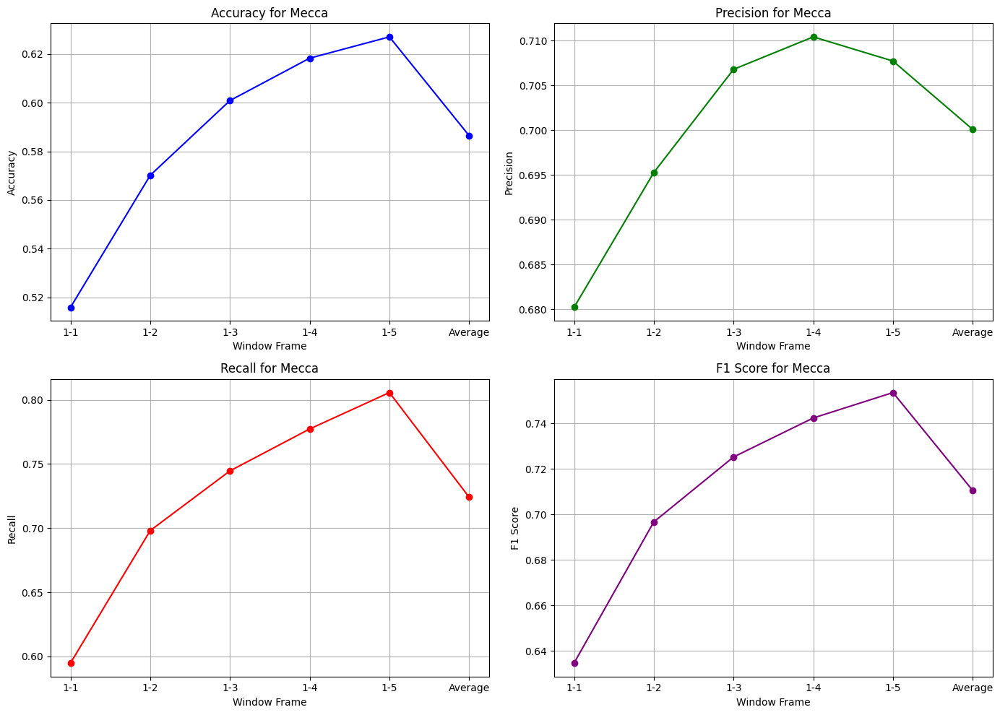

Metrics plots for Mecca saved to: /content/drive/MyDrive/CSE498R/metrics_plots_for_mecca.pdf


In [ ]:
# Plot the graphs for the metrics
fig, ax = plt.subplots(2, 2, figsize=(14, 10))

# Accuracy plot
# Use metrics_df_mecca instead of metrics_df
ax[0, 0].plot(metrics_df_mecca['Window Frame'], metrics_df_mecca['Accuracy'], marker='o', color='blue', label='Accuracy')
ax[0, 0].set_title('Accuracy for Mecca')
ax[0, 0].set_xlabel('Window Frame')
ax[0, 0].set_ylabel('Accuracy')
ax[0, 0].grid(True)

# Precision plot
# Use metrics_df_mecca instead of metrics_df
ax[0, 1].plot(metrics_df_mecca['Window Frame'], metrics_df_mecca['Precision'], marker='o', color='green', label='Precision')
ax[0, 1].set_title('Precision for Mecca')
ax[0, 1].set_xlabel('Window Frame')
ax[0, 1].set_ylabel('Precision')
ax[0, 1].grid(True)

# Recall plot
# Use metrics_df_mecca instead of metrics_df
ax[1, 0].plot(metrics_df_mecca['Window Frame'], metrics_df_mecca['Recall'], marker='o', color='red', label='Recall')
ax[1, 0].set_title('Recall for Mecca')
ax[1, 0].set_xlabel('Window Frame')
ax[1, 0].set_ylabel('Recall')
ax[1, 0].grid(True)

# F1 Score plot
# Use metrics_df_mecca instead of metrics_df
ax[1, 1].plot(metrics_df_mecca['Window Frame'], metrics_df_mecca['F1 Score'], marker='o', color='purple', label='F1 Score')
ax[1, 1].set_title('F1 Score for Mecca')
ax[1, 1].set_xlabel('Window Frame')
ax[1, 1].set_ylabel('F1 Score')
ax[1, 1].grid(True)

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the plot as a PDF
plot_file_path = '/content/drive/MyDrive/CSE498R/metrics_plots_for_mecca.pdf'
plt.savefig(plot_file_path)

# Show the plot
plt.show()

# Inform the user that the plot has been saved
print(f'Metrics plots for Mecca saved to: {plot_file_path}')

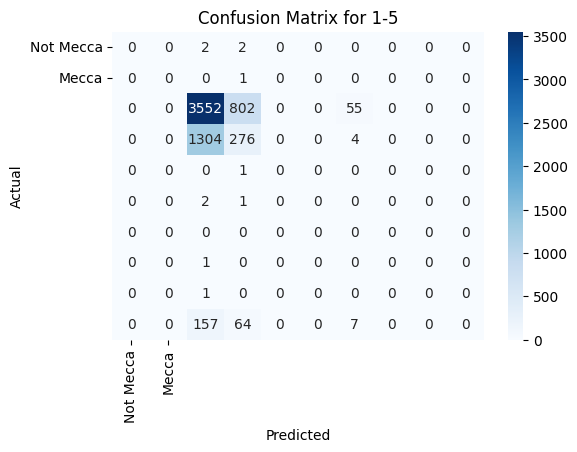

In [ ]:
cm = confusion_matrix(df['Actual Period'], df['Predicted Period'])

# Print confusion matrix with Seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Mecca', 'Mecca'], yticklabels=['Not Mecca', 'Mecca'])
plt.title(f'Confusion Matrix for {window_frame}')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


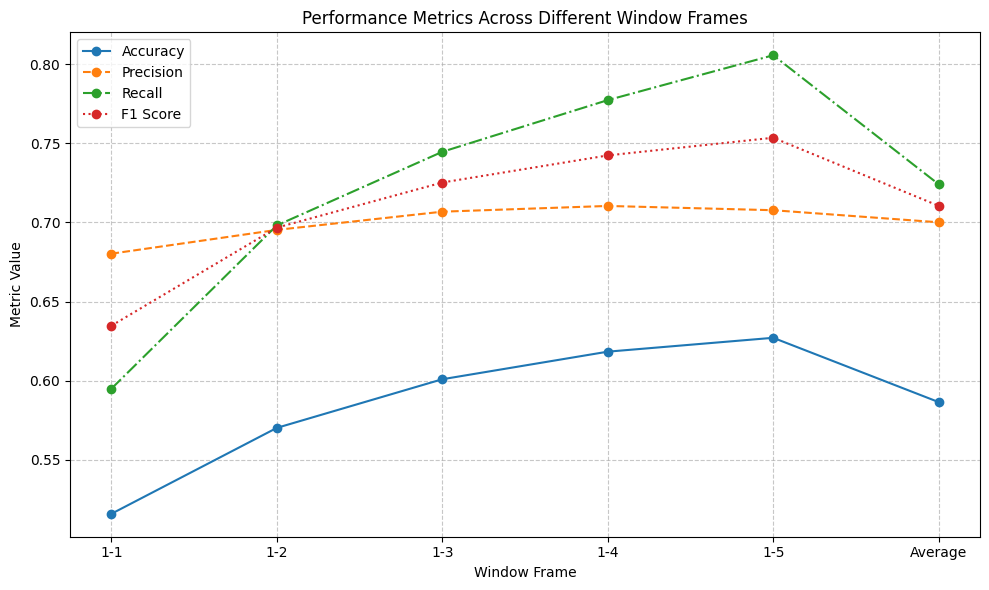

In [ ]:
# import matplotlib.pyplot as plt

# Extract data for plotting
# Use metrics_df_mecca instead of metrics_df
window_frames = metrics_df_mecca['Window Frame']
accuracy = metrics_df_mecca['Accuracy']
precision = metrics_df_mecca['Precision']
recall = metrics_df_mecca['Recall']
f1_score = metrics_df_mecca['F1 Score']

# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Plot each metric
plt.plot(window_frames, accuracy, label='Accuracy', marker='o', linestyle='-')
plt.plot(window_frames, precision, label='Precision', marker='o', linestyle='--')
plt.plot(window_frames, recall, label='Recall', marker='o', linestyle='-.')
plt.plot(window_frames, f1_score, label='F1 Score', marker='o', linestyle=':')

# Add title and labels
plt.title('Performance Metrics Across Different Window Frames')
plt.xlabel('Window Frame')
plt.ylabel('Metric Value')

# Add legend
plt.legend()

# Display grid
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
from sklearn.metrics import recall_score, f1_score, accuracy_score

# List of window frames to evaluate
window_frames = ['1-1', '1-2', '1-3', '1-4', '1-5']
file_paths = [

    '/content/drive/MyDrive/CSE498R/DFM1.xlsx',
    '/content/drive/MyDrive/CSE498R/DFM2.xlsx',
    '/content/drive/MyDrive/CSE498R/DFM3.xlsx',
    '/content/drive/MyDrive/CSE498R/DFM4.xlsx',
    '/content/drive/MyDrive/CSE498R/DFM5.xlsx'
]

# Initialize lists to store metrics for Medina
metrics_data_medina = []

def compute_metrics_medina(df):
    """
    Compute accuracy, precision, recall, and F1-score for Medina predictions.
    Precision for Medina is calculated as:
    Precision = (True Positives for Medina) / (True Positives for Medina + False Positives for Medina)
    """
    # Filter for Medina and Mecca only
    actual_medina = df['Actual Period'] == 'Medina'
    predicted_medina = df['Predicted Period'] == 'Medina'

    # Calculate True Positives (TP) for Medina and False Positives (FP) for Medina
    true_positive_medina = (actual_medina & predicted_medina).sum()
    false_positive_medina = (~actual_medina & predicted_medina).sum()
    false_negative_medina = (actual_medina & ~predicted_medina).sum()
    true_negative_medina = (~actual_medina & ~predicted_medina).sum()

    # Precision for Medina based on the custom formula
    precision_medina = true_positive_medina / (true_positive_medina + false_positive_medina) if (true_positive_medina + false_positive_medina) > 0 else 0

    # Recall for Medina (standard recall formula)
    recall_medina = recall_score(actual_medina, predicted_medina)

    # F1 score for Medina (standard F1 score formula)
    f1_medina = f1_score(actual_medina, predicted_medina)

    # Accuracy (standard accuracy formula)
    accuracy = accuracy_score(actual_medina, predicted_medina)

    return accuracy, precision_medina, recall_medina, f1_medina

# Loop through each window frame and compute metrics for Medina
for file_path, window_frame in zip(file_paths, window_frames):
    # Load the DataFrame
    df = pd.read_excel(file_path)

    # Calculate metrics for Medina
    accuracy, precision, recall, f1 = compute_metrics_medina(df)

    # Append metrics to the list for Medina
    metrics_data_medina.append([window_frame, accuracy, precision, recall, f1])

# Create a DataFrame for the metrics for Medina
metrics_df_medina = pd.DataFrame(metrics_data_medina, columns=['Window Frame', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])

# Calculate averages for each metric
averages = metrics_df_medina[['Accuracy', 'Precision', 'Recall', 'F1 Score']].mean() # Use metrics_df_medina here

# Append the averages as a new row using pd.concat
metrics_df_medina = pd.concat([metrics_df_medina, pd.DataFrame([{'Window Frame': 'Average', **averages.to_dict()}])], ignore_index=True) # Use metrics_df_medina here

# Save the DataFrame to an Excel file
output_file_path_medina = '/content/drive/MyDrive/CSE498R/metrics_results_for_medina.xlsx'
metrics_df_medina.to_excel(output_file_path_medina, index=False)

# Inform the user that the file has been saved
print(f'Metrics table for Medina saved to: {output_file_path_medina}')

Metrics table for Medina saved to: /content/drive/MyDrive/CSE498R/metrics_results_for_medina.xlsx


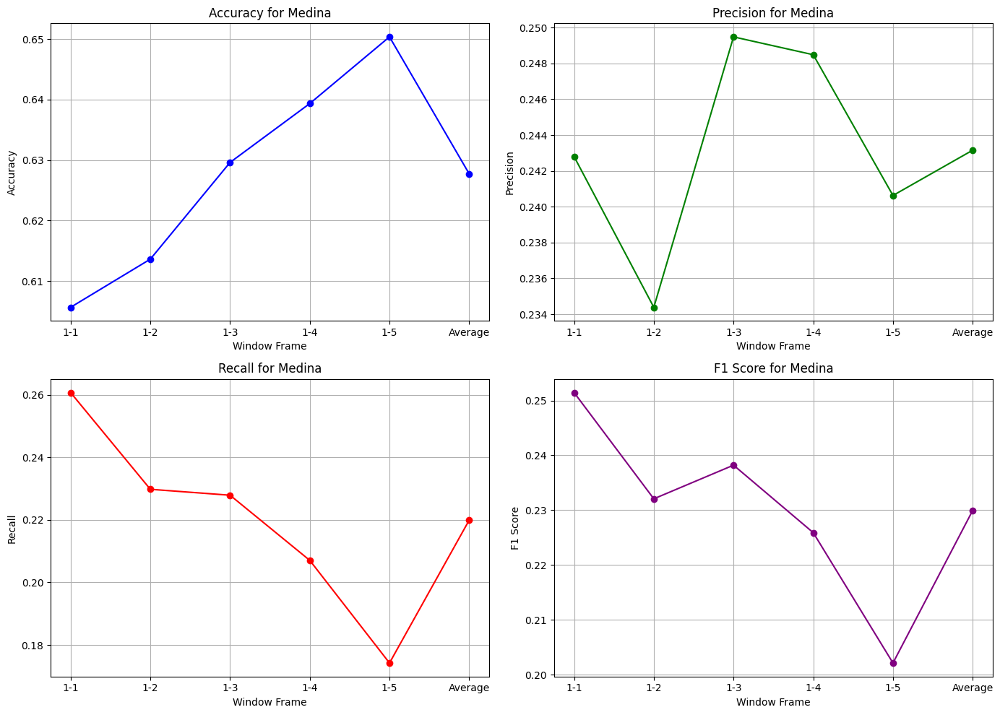

Metrics plots for Medina saved to: /content/drive/MyDrive/CSE498R/metrics_plots_for_medina.pdf


In [ ]:
# Plot the graphs for the metrics
fig, ax = plt.subplots(2, 2, figsize=(14, 10))

# Accuracy plot
ax[0, 0].plot(metrics_df_medina['Window Frame'], metrics_df_medina['Accuracy'], marker='o', color='blue', label='Accuracy')
ax[0, 0].set_title('Accuracy for Medina')
ax[0, 0].set_xlabel('Window Frame')
ax[0, 0].set_ylabel('Accuracy')
ax[0, 0].grid(True)

# Precision plot
ax[0, 1].plot(metrics_df_medina['Window Frame'], metrics_df_medina['Precision'], marker='o', color='green', label='Precision')
ax[0, 1].set_title('Precision for Medina')
ax[0, 1].set_xlabel('Window Frame')
ax[0, 1].set_ylabel('Precision')
ax[0, 1].grid(True)

# Recall plot
ax[1, 0].plot(metrics_df_medina['Window Frame'], metrics_df_medina['Recall'], marker='o', color='red', label='Recall')
ax[1, 0].set_title('Recall for Medina')
ax[1, 0].set_xlabel('Window Frame')
ax[1, 0].set_ylabel('Recall')
ax[1, 0].grid(True)

# F1 Score plot
ax[1, 1].plot(metrics_df_medina['Window Frame'], metrics_df_medina['F1 Score'], marker='o', color='purple', label='F1 Score')
ax[1, 1].set_title('F1 Score for Medina')
ax[1, 1].set_xlabel('Window Frame')
ax[1, 1].set_ylabel('F1 Score')
ax[1, 1].grid(True)

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the plot as a PDF
plot_file_path = '/content/drive/MyDrive/CSE498R/metrics_plots_for_medina.pdf'
plt.savefig(plot_file_path)

# Show the plot
plt.show()

# Inform the user that the plot has been saved
print(f'Metrics plots for Medina saved to: {plot_file_path}')

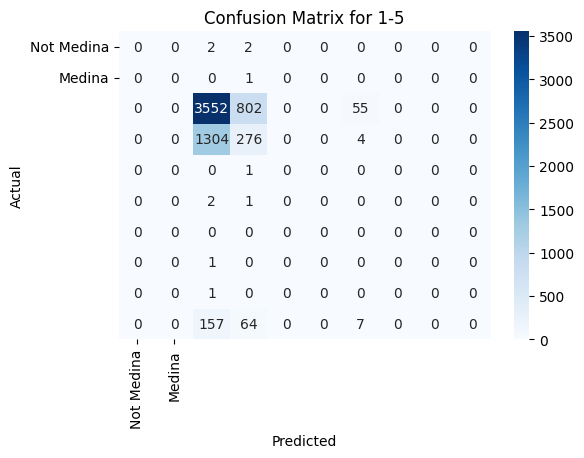

In [ ]:
cm = confusion_matrix(df['Actual Period'], df['Predicted Period'])
# Print confusion matrix with Seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Medina', 'Medina'], yticklabels=['Not Medina', 'Medina'])
plt.title(f'Confusion Matrix for {window_frame}')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

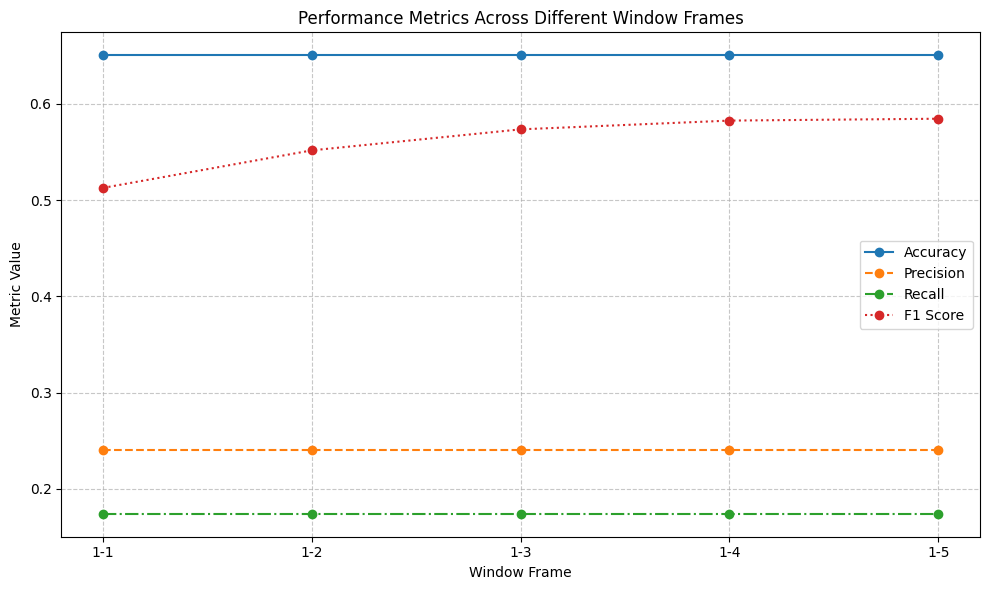

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score # Import the f1_score function

# Using existing variables
accuracy_data = accuracy  # Assuming 'accuracy' variable contains the accuracy values
precision_data = precision  # Assuming 'precision' variable contains the precision values
recall_data = recall  # Assuming 'recall' variable contains the recall values
# Ensure f1_score_data is calculated correctly

# Modify this line to specify 'average' parameter
f1_score_data = [f1_score(df['Actual Period'], df['Predicted Period'], average='weighted') # Specify 'weighted', 'micro', or 'macro'
                 for df in [pd.read_excel(file_path) for file_path in file_paths]]

window_frames_data = window_frames  # Assuming 'window_frames' variable contains the window frames

# Create a dictionary from the data
data = {
    'Window Frame': window_frames_data,
    'Accuracy': accuracy_data,
    'Precision': precision_data,
    'Recall': recall_data,
    'F1 Score': f1_score_data
}

# Create the DataFrame
metrics_df = pd.DataFrame(data)

# Extract data for plotting
window_frames = metrics_df['Window Frame']
accuracy = metrics_df['Accuracy']
precision = metrics_df['Precision']
recall = metrics_df['Recall']
f1_score = metrics_df['F1 Score']

# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Plot each metric
plt.plot(window_frames, accuracy, label='Accuracy', marker='o', linestyle='-')
plt.plot(window_frames, precision, label='Precision', marker='o', linestyle='--')
plt.plot(window_frames, recall, label='Recall', marker='o', linestyle='-.')
plt.plot(window_frames, f1_score, label='F1 Score', marker='o', linestyle=':')

# Add title and labels
plt.title('Performance Metrics Across Different Window Frames')
plt.xlabel('Window Frame')
plt.ylabel('Metric Value')

# Add legend
plt.legend()

# Display grid
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

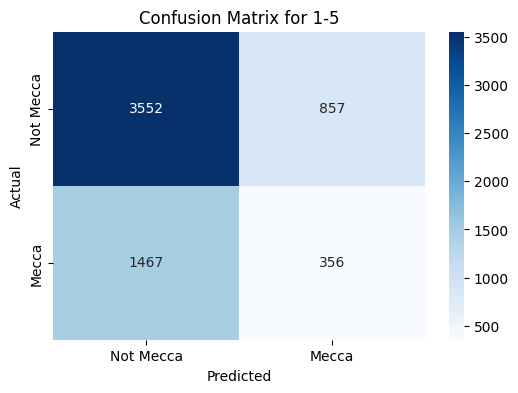

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


# Assuming 'df' is your DataFrame containing 'Actual Period' and 'Predicted Period'
# Replace this with the correct DataFrame name or filtering if necessary
df = pd.read_excel('/content/drive/MyDrive/CSE498R/DFM5.xlsx')  # Example: Using the last file in your file_paths

# Filter for Mecca and Medina only (replace 'Actual Period' and 'Predicted Period' with your actual column names)
actual = df['Actual Period'].apply(lambda x: 'Mecca' if x == 'Mecca' else 'Not Mecca')
predicted = df['Predicted Period'].apply(lambda x: 'Mecca' if x == 'Mecca' else 'Not Mecca')

# Calculate the confusion matrix
cm = confusion_matrix(actual, predicted)

# Print confusion matrix with Seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Mecca', 'Mecca'], yticklabels=['Not Mecca', 'Mecca'])
plt.title(f'Confusion Matrix for {window_frame}')  # Make sure window_frame is defined and available
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

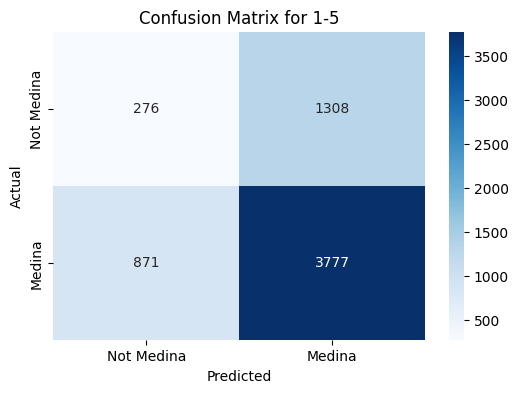

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


# Assuming 'df' is your DataFrame containing 'Actual Period' and 'Predicted Period'
# Replace this with the correct DataFrame name or filtering if necessary
df = pd.read_excel('/content/drive/MyDrive/CSE498R/DFM5.xlsx')  # Example: Using the last file in your file_paths

# Filter for Mecca and Medina only (replace 'Actual Period' and 'Predicted Period' with your actual column names)
actual = df['Actual Period'].apply(lambda x: 'Medina' if x == 'Medina' else 'Not Medina')
predicted = df['Predicted Period'].apply(lambda x: 'Medina' if x == 'Medina' else 'Not Medina')

# Calculate the confusion matrix
cm = confusion_matrix(actual, predicted)

# Print confusion matrix with Seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Medina', 'Medina'], yticklabels=['Not Medina', 'Medina'])
plt.title(f'Confusion Matrix for {window_frame}')  # Make sure window_frame is defined and available
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
pip install reportlab

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 42.1 MB/s eta 0:00:00


In [ ]:
import os
import pandas as pd
import re
from sentence_transformers import SentenceTransformer, util
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas

# Function to clean the text and close spacing within paragraphs
def clean_text(text):
    # Remove extra spaces between words in each line
    text = re.sub(r'[ ]{2,}', ' ', text)  # Replace multiple spaces with a single space
    # Close line spacing within paragraphs
    text = re.sub(r'(?<!\n)\n(?!\n)', ' ', text)  # Merge lines within paragraphs
    # Ensure paragraphs are separated by two newlines
    text = re.sub(r'\n{2,}', '\n\n', text)  # Ensure double newlines between paragraphs
    return text

# Paths to Quran dataset and Mecca/Medina folders
quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'
mecca_folder_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Mecca'
medina_folder_path = '/content/drive/MyDrive/CSE498R/The Valley Came Alive/Medina'

# Load Quran dataset
quran_df = pd.read_excel(quran_file_path)
quran_verses = quran_df['english_translation'].tolist()  # Adjust column name as per dataset structure

# Function to load biographies from a folder
def load_biographies_from_folder(folder_path, period_label):
    biographies = []
    for i, filename in enumerate(sorted(os.listdir(folder_path)), start=1):
        file_path = os.path.join(folder_path, filename)
        if os.path.isfile(file_path) and filename.endswith('.txt'):  # Ensure it is a text file
            with open(file_path, 'r', encoding='utf-8') as file:
                content = file.read().strip()
                if content:
                    biographies.append({
                        'Biography Number': i,
                        'Biography Line': clean_text(content),
                        'Period': period_label
                    })
    return biographies

# Load the Mecca and Medina biographies
mecca_biographies = load_biographies_from_folder(mecca_folder_path, 'Mecca')
medina_biographies = load_biographies_from_folder(medina_folder_path, 'Medina')

# Combine both biographies
all_biographies = mecca_biographies + medina_biographies

# Extract biography details
biography_numbers = [bio['Biography Number'] for bio in all_biographies]
biography_texts = [bio['Biography Line'] for bio in all_biographies]
biography_periods = [bio['Period'] for bio in all_biographies]

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Encode the Quran verses and biographies
quran_embeddings = model.encode(quran_verses, convert_to_tensor=True)
biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

# Perform similarity matching
results = []
for verse_idx, verse in enumerate(quran_verses):
    verse_embedding = quran_embeddings[verse_idx]
    similarity_scores = util.pytorch_cos_sim(verse_embedding, biography_embeddings)[0]

    # Find the best match
    best_match_idx = similarity_scores.argmax().item()
    best_match_score = similarity_scores[best_match_idx].item()

    # Fetch the best match biography details
    best_biography_number = biography_numbers[best_match_idx]
    best_biography_line = biography_texts[best_match_idx].split('\n')[0]  # Take only the first line
    best_biography_period = biography_periods[best_match_idx]

    # Append the result
    results.append({
        'Surah No': quran_df.loc[verse_idx, 'surah_no'],  # Adjust column name if needed
        'Verse No': quran_df.loc[verse_idx, 'verse_no'],  # Adjust column name if needed
        'Verse': verse,
        'Best Match Line': best_biography_line,
        'Best Match Score': round(best_match_score * 100, 2),
        'Biography Number': best_biography_number,
        'Period': best_biography_period  # Include the period (Mecca or Medina)
    })

# Generate PDF
pdf_file_path = "/content/drive/MyDrive/CSE498R/similarity_results.pdf"
c = canvas.Canvas(pdf_file_path, pagesize=letter)
width, height = letter  # Page size

# Starting position for the text
x = 50
y = height - 50

# Set font
c.setFont("Helvetica", 10)

# Add the results to the PDF
for result in results:
    if y < 100:  # Check if we need to add a new page
        c.showPage()
        c.setFont("Helvetica", 10)
        y = height - 50  # Reset y position

    c.drawString(x, y, f"Surah No: {result['Surah No']}")
    y -= 12
    c.drawString(x, y, f"Verse No: {result['Verse No']}")
    y -= 12
    c.drawString(x, y, f"Verse: {result['Verse']}")
    y -= 12
    c.drawString(x, y, f"Best Match Line: {result['Best Match Line']}")
    y -= 12
    c.drawString(x, y, f"Best Match Score: {result['Best Match Score']}%")
    y -= 12
    c.drawString(x, y, f"Biography Number: {result['Biography Number']}")
    y -= 12
    c.drawString(x, y, f"Period: {result['Period']}")
    y -= 20
    c.drawString(x, y, "-" * 50)  # Separator line
    y -= 10

# Save the PDF
c.save()

print(f"PDF has been saved at {pdf_file_path}")

PDF has been saved at /content/drive/MyDrive/CSE498R/similarity_results.pdf


# #**DF**-05

In [ ]:
import os
import pandas as pd
from sentence_transformers import SentenceTransformer, util
import re

# Load the Quran dataset
quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'
quran_df = pd.read_excel(quran_file_path)

# Load the biography datasets (Mecca and Medina)
biography_makka_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/mecca_VCA_windowFrame5.xlsx'
biography_medina_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/medina_VCA_windowFrame5.xlsx'

# Load biography files as DataFrame
biography_makka_df = pd.read_excel(biography_makka_path, header=None, names=['paragraph'])
biography_medina_df = pd.read_excel(biography_medina_path, header=None, names=['paragraph'])

# Reset the index to a simple RangeIndex before adding 1
biography_makka_df = biography_makka_df.reset_index(drop=True)
biography_medina_df = biography_medina_df.reset_index(drop=True)

# Add 'Biography Number' to identify paragraphs
biography_makka_df['Biography No'] = biography_makka_df.index + 1
biography_medina_df['Biography No'] = biography_medina_df.index + 1

# Combine the biography datasets into a single DataFrame with a 'Revelation_Period' column
biography_makka_df['Revelation_Period'] = 'Mecca'
biography_medina_df['Revelation_Period'] = 'Medina'
biography_df = pd.concat([biography_makka_df, biography_medina_df], ignore_index=True)

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Function to infer relationship based on keywords in both verse and best match line
def infer_relationship(verse, biography_line):
    if 'battle' in verse.lower() or 'battle' in biography_line.lower():
        return 'Historical Context (Battle)'
    elif 'believe' in verse.lower() or 'faith' in biography_line.lower():
        return 'Spiritual Guidance'
    elif 'prophet' in verse.lower() or 'messenger' in biography_line.lower():
        return 'Prophetic Actions'
    elif 'law' in verse.lower() or 'command' in biography_line.lower():
        return 'Legal/Instructional'
    elif 'community' in verse.lower() or 'ummah' in biography_line.lower():
        return 'Community Impact'
    else:
        return 'General Contextual Relationship'

# Function to clean text for Excel compatibility
def clean_text_for_excel(text):
    return re.sub(r'[\x00-\x09\x0b-\x1f\x7f-\x9f]', '', text)

# Function for enhanced similarity and prediction
def find_best_similarity_with_biography(quran_df, biography_df, window_size=1, threshold=0.4, top_n=5):
    results = []

    surah_numbers = quran_df['surah_no'].tolist()
    verse_numbers = quran_df['verse_no'].tolist()
    verses = quran_df['english_translation'].tolist()
    periods = quran_df['Revelation_Period'].tolist()

    verse_embeddings = model.encode(verses, convert_to_tensor=True)
    biography_texts = biography_df['paragraph'].tolist()
    biography_periods = biography_df['Revelation_Period'].tolist()
    biography_lines = biography_df['Biography No'].tolist()
    biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

    for i in range(len(verses) - window_size + 1):
        verse_frame = ' '.join(verses[i:i + window_size])
        verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"
        actual_period = periods[i]

        frame_embedding = model.encode(verse_frame, convert_to_tensor=True)
        similarity_scores = util.pytorch_cos_sim(frame_embedding, biography_embeddings)[0]

        top_indices = similarity_scores.topk(top_n).indices
        top_scores = similarity_scores[top_indices].tolist()

        # Calculate the best match line and its associated properties
        best_match_idx = top_indices[0].item()
        best_match_line = biography_texts[best_match_idx]
        best_match_score = top_scores[0]
        assigned_biography = biography_periods[best_match_idx]
        best_biography_line = biography_lines[best_match_idx]  # Get the biography number

        # Infer the relationship between the verse and the biography
        relationship = infer_relationship(verse_frame, best_match_line)

        # Calculate Biography Line Range (based on top N lines)
        biography_line_range = f"{biography_lines[top_indices[0]]}-{biography_lines[top_indices[-1]]}"

        # Append results
        results.append({
            'Surah No': surah_numbers[i],
            'Verse Range': verse_range,
            'Verse (as Window Frame)': clean_text_for_excel(verse_frame),
            'Actual Period': actual_period,
            'Predicted Period': assigned_biography,
            'Best Match Line': clean_text_for_excel(best_match_line),
            'Best Match Score (as percentage)': round(best_match_score * 100, 2),
            'Assigned Biography': assigned_biography,
            'Biography line no': best_biography_line,
            'Biography Line Range': biography_line_range,  # New column for biography line range
            'Biography Name': best_biography_line,  # New column for biography name (i.e., Biography No)
            'Relationship': relationship
        })

    return results

# Generate the similarity results with improved accuracy
similarity_results = find_best_similarity_with_biography(quran_df, biography_df)
results_df = pd.DataFrame(similarity_results)

# Save results to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM5.xlsx'
results_df.to_excel(output_file_path, index=False)

print(f"Optimized similarity results saved to {output_file_path}")

Optimized similarity results saved to /content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM5.xlsx


# **DF**-04

In [ ]:
import os
import pandas as pd
from sentence_transformers import SentenceTransformer, util
import re

# Load the Quran dataset
quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'
quran_df = pd.read_excel(quran_file_path)

# Load the biography datasets (Mecca and Medina)
biography_makka_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/mecca_VCA_windowFrame4.xlsx'
biography_medina_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/medina_VCA_windowFrame4.xlsx'

# Load biography files as DataFrame
biography_makka_df = pd.read_excel(biography_makka_path, header=None, names=['paragraph'])
biography_medina_df = pd.read_excel(biography_medina_path, header=None, names=['paragraph'])

# Reset the index to a simple RangeIndex before adding 1
biography_makka_df = biography_makka_df.reset_index(drop=True)
biography_medina_df = biography_medina_df.reset_index(drop=True)

# Add 'Biography Number' to identify paragraphs
biography_makka_df['Biography No'] = biography_makka_df.index + 1
biography_medina_df['Biography No'] = biography_medina_df.index + 1

# Combine the biography datasets into a single DataFrame with a 'Revelation_Period' column
biography_makka_df['Revelation_Period'] = 'Mecca'
biography_medina_df['Revelation_Period'] = 'Medina'
biography_df = pd.concat([biography_makka_df, biography_medina_df], ignore_index=True)

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Function to infer relationship based on keywords in both verse and best match line
def infer_relationship(verse, biography_line):
    if 'battle' in verse.lower() or 'battle' in biography_line.lower():
        return 'Historical Context (Battle)'
    elif 'believe' in verse.lower() or 'faith' in biography_line.lower():
        return 'Spiritual Guidance'
    elif 'prophet' in verse.lower() or 'messenger' in biography_line.lower():
        return 'Prophetic Actions'
    elif 'law' in verse.lower() or 'command' in biography_line.lower():
        return 'Legal/Instructional'
    elif 'community' in verse.lower() or 'ummah' in biography_line.lower():
        return 'Community Impact'
    else:
        return 'General Contextual Relationship'

# Function to clean text for Excel compatibility
def clean_text_for_excel(text):
    return re.sub(r'[\x00-\x09\x0b-\x1f\x7f-\x9f]', '', text)

# Function for enhanced similarity and prediction
def find_best_similarity_with_biography(quran_df, biography_df, window_size=1, threshold=0.4, top_n=5):
    results = []

    surah_numbers = quran_df['surah_no'].tolist()
    verse_numbers = quran_df['verse_no'].tolist()
    verses = quran_df['english_translation'].tolist()
    periods = quran_df['Revelation_Period'].tolist()

    verse_embeddings = model.encode(verses, convert_to_tensor=True)
    biography_texts = biography_df['paragraph'].tolist()
    biography_periods = biography_df['Revelation_Period'].tolist()
    biography_lines = biography_df['Biography No'].tolist()
    biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

    for i in range(len(verses) - window_size + 1):
        verse_frame = ' '.join(verses[i:i + window_size])
        verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"
        actual_period = periods[i]

        frame_embedding = model.encode(verse_frame, convert_to_tensor=True)
        similarity_scores = util.pytorch_cos_sim(frame_embedding, biography_embeddings)[0]

        top_indices = similarity_scores.topk(top_n).indices
        top_scores = similarity_scores[top_indices].tolist()

        # Calculate the best match line and its associated properties
        best_match_idx = top_indices[0].item()
        best_match_line = biography_texts[best_match_idx]
        best_match_score = top_scores[0]
        assigned_biography = biography_periods[best_match_idx]
        best_biography_line = biography_lines[best_match_idx]  # Get the biography number

        # Infer the relationship between the verse and the biography
        relationship = infer_relationship(verse_frame, best_match_line)

        # Calculate Biography Line Range (based on top N lines)
        biography_line_range = f"{biography_lines[top_indices[0]]}-{biography_lines[top_indices[-1]]}"

        # Append results
        results.append({
            'Surah No': surah_numbers[i],
            'Verse Range': verse_range,
            'Verse (as Window Frame)': clean_text_for_excel(verse_frame),
            'Actual Period': actual_period,
            'Predicted Period': assigned_biography,
            'Best Match Line': clean_text_for_excel(best_match_line),
            'Best Match Score (as percentage)': round(best_match_score * 100, 2),
            'Assigned Biography': assigned_biography,
            'Biography line no': best_biography_line,
            'Biography Line Range': biography_line_range,  # New column for biography line range
            'Biography Name': best_biography_line,  # New column for biography name (i.e., Biography No)
            'Relationship': relationship
        })

    return results

# Generate the similarity results with improved accuracy
similarity_results = find_best_similarity_with_biography(quran_df, biography_df)
results_df = pd.DataFrame(similarity_results)

# Save results to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM4.xlsx'
results_df.to_excel(output_file_path, index=False)

print(f"Optimized similarity results saved to {output_file_path}")

Optimized similarity results saved to /content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM4.xlsx


# **DF**-03

In [ ]:
import os
import pandas as pd
from sentence_transformers import SentenceTransformer, util
import re

# Load the Quran dataset
quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'
quran_df = pd.read_excel(quran_file_path)

# Load the biography datasets (Mecca and Medina)
biography_makka_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/mecca_VCA_windowFrame3.xlsx'
biography_medina_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/medina_VCA_windowFrame3.xlsx'

# Load biography files as DataFrame
biography_makka_df = pd.read_excel(biography_makka_path, header=None, names=['paragraph'])
biography_medina_df = pd.read_excel(biography_medina_path, header=None, names=['paragraph'])

# Reset the index to a simple RangeIndex before adding 1
biography_makka_df = biography_makka_df.reset_index(drop=True)
biography_medina_df = biography_medina_df.reset_index(drop=True)

# Add 'Biography Number' to identify paragraphs
biography_makka_df['Biography No'] = biography_makka_df.index + 1
biography_medina_df['Biography No'] = biography_medina_df.index + 1

# Combine the biography datasets into a single DataFrame with a 'Revelation_Period' column
biography_makka_df['Revelation_Period'] = 'Mecca'
biography_medina_df['Revelation_Period'] = 'Medina'
biography_df = pd.concat([biography_makka_df, biography_medina_df], ignore_index=True)

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Function to infer relationship based on keywords in both verse and best match line
def infer_relationship(verse, biography_line):
    if 'battle' in verse.lower() or 'battle' in biography_line.lower():
        return 'Historical Context (Battle)'
    elif 'believe' in verse.lower() or 'faith' in biography_line.lower():
        return 'Spiritual Guidance'
    elif 'prophet' in verse.lower() or 'messenger' in biography_line.lower():
        return 'Prophetic Actions'
    elif 'law' in verse.lower() or 'command' in biography_line.lower():
        return 'Legal/Instructional'
    elif 'community' in verse.lower() or 'ummah' in biography_line.lower():
        return 'Community Impact'
    else:
        return 'General Contextual Relationship'

# Function to clean text for Excel compatibility
def clean_text_for_excel(text):
    return re.sub(r'[\x00-\x09\x0b-\x1f\x7f-\x9f]', '', text)

# Function for enhanced similarity and prediction
def find_best_similarity_with_biography(quran_df, biography_df, window_size=1, threshold=0.4, top_n=5):
    results = []

    surah_numbers = quran_df['surah_no'].tolist()
    verse_numbers = quran_df['verse_no'].tolist()
    verses = quran_df['english_translation'].tolist()
    periods = quran_df['Revelation_Period'].tolist()

    verse_embeddings = model.encode(verses, convert_to_tensor=True)
    biography_texts = biography_df['paragraph'].tolist()
    biography_periods = biography_df['Revelation_Period'].tolist()
    biography_lines = biography_df['Biography No'].tolist()
    biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

    for i in range(len(verses) - window_size + 1):
        verse_frame = ' '.join(verses[i:i + window_size])
        verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"
        actual_period = periods[i]

        frame_embedding = model.encode(verse_frame, convert_to_tensor=True)
        similarity_scores = util.pytorch_cos_sim(frame_embedding, biography_embeddings)[0]

        top_indices = similarity_scores.topk(top_n).indices
        top_scores = similarity_scores[top_indices].tolist()

        # Calculate the best match line and its associated properties
        best_match_idx = top_indices[0].item()
        best_match_line = biography_texts[best_match_idx]
        best_match_score = top_scores[0]
        assigned_biography = biography_periods[best_match_idx]
        best_biography_line = biography_lines[best_match_idx]  # Get the biography number

        # Infer the relationship between the verse and the biography
        relationship = infer_relationship(verse_frame, best_match_line)

        # Calculate Biography Line Range (based on top N lines)
        biography_line_range = f"{biography_lines[top_indices[0]]}-{biography_lines[top_indices[-1]]}"

        # Append results
        results.append({
            'Surah No': surah_numbers[i],
            'Verse Range': verse_range,
            'Verse (as Window Frame)': clean_text_for_excel(verse_frame),
            'Actual Period': actual_period,
            'Predicted Period': assigned_biography,
            'Best Match Line': clean_text_for_excel(best_match_line),
            'Best Match Score (as percentage)': round(best_match_score * 100, 2),
            'Assigned Biography': assigned_biography,
            'Biography line no': best_biography_line,
            'Biography Line Range': biography_line_range,  # New column for biography line range
            'Biography Name': best_biography_line,  # New column for biography name (i.e., Biography No)
            'Relationship': relationship
        })

    return results

# Generate the similarity results with improved accuracy
similarity_results = find_best_similarity_with_biography(quran_df, biography_df)
results_df = pd.DataFrame(similarity_results)

# Save results to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM3.xlsx'
results_df.to_excel(output_file_path, index=False)

print(f"Optimized similarity results saved to {output_file_path}")

Optimized similarity results saved to /content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM3.xlsx


# **DF**-02

In [ ]:
import os
import pandas as pd
from sentence_transformers import SentenceTransformer, util
import re

# Load the Quran dataset
quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'
quran_df = pd.read_excel(quran_file_path)

# Load the biography datasets (Mecca and Medina)
biography_makka_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/mecca_VCA_windowFrame2.xlsx'
biography_medina_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/medina_VCA_windowFrame2.xlsx'

# Load biography files as DataFrame
biography_makka_df = pd.read_excel(biography_makka_path, header=None, names=['paragraph'])
biography_medina_df = pd.read_excel(biography_medina_path, header=None, names=['paragraph'])

# Reset the index to a simple RangeIndex before adding 1
biography_makka_df = biography_makka_df.reset_index(drop=True)
biography_medina_df = biography_medina_df.reset_index(drop=True)

# Add 'Biography Number' to identify paragraphs
biography_makka_df['Biography No'] = biography_makka_df.index + 1
biography_medina_df['Biography No'] = biography_medina_df.index + 1

# Combine the biography datasets into a single DataFrame with a 'Revelation_Period' column
biography_makka_df['Revelation_Period'] = 'Mecca'
biography_medina_df['Revelation_Period'] = 'Medina'
biography_df = pd.concat([biography_makka_df, biography_medina_df], ignore_index=True)

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Function to infer relationship based on keywords in both verse and best match line
def infer_relationship(verse, biography_line):
    if 'battle' in verse.lower() or 'battle' in biography_line.lower():
        return 'Historical Context (Battle)'
    elif 'believe' in verse.lower() or 'faith' in biography_line.lower():
        return 'Spiritual Guidance'
    elif 'prophet' in verse.lower() or 'messenger' in biography_line.lower():
        return 'Prophetic Actions'
    elif 'law' in verse.lower() or 'command' in biography_line.lower():
        return 'Legal/Instructional'
    elif 'community' in verse.lower() or 'ummah' in biography_line.lower():
        return 'Community Impact'
    else:
        return 'General Contextual Relationship'

# Function to clean text for Excel compatibility
def clean_text_for_excel(text):
    return re.sub(r'[\x00-\x09\x0b-\x1f\x7f-\x9f]', '', text)

# Function for enhanced similarity and prediction
def find_best_similarity_with_biography(quran_df, biography_df, window_size=1, threshold=0.4, top_n=5):
    results = []

    surah_numbers = quran_df['surah_no'].tolist()
    verse_numbers = quran_df['verse_no'].tolist()
    verses = quran_df['english_translation'].tolist()
    periods = quran_df['Revelation_Period'].tolist()

    verse_embeddings = model.encode(verses, convert_to_tensor=True)
    biography_texts = biography_df['paragraph'].tolist()
    biography_periods = biography_df['Revelation_Period'].tolist()
    biography_lines = biography_df['Biography No'].tolist()
    biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

    for i in range(len(verses) - window_size + 1):
        verse_frame = ' '.join(verses[i:i + window_size])
        verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"
        actual_period = periods[i]

        frame_embedding = model.encode(verse_frame, convert_to_tensor=True)
        similarity_scores = util.pytorch_cos_sim(frame_embedding, biography_embeddings)[0]

        top_indices = similarity_scores.topk(top_n).indices
        top_scores = similarity_scores[top_indices].tolist()

        # Calculate the best match line and its associated properties
        best_match_idx = top_indices[0].item()
        best_match_line = biography_texts[best_match_idx]
        best_match_score = top_scores[0]
        assigned_biography = biography_periods[best_match_idx]
        best_biography_line = biography_lines[best_match_idx]  # Get the biography number

        # Infer the relationship between the verse and the biography
        relationship = infer_relationship(verse_frame, best_match_line)

        # Calculate Biography Line Range (based on top N lines)
        biography_line_range = f"{biography_lines[top_indices[0]]}-{biography_lines[top_indices[-1]]}"

        # Append results
        results.append({
            'Surah No': surah_numbers[i],
            'Verse Range': verse_range,
            'Verse (as Window Frame)': clean_text_for_excel(verse_frame),
            'Actual Period': actual_period,
            'Predicted Period': assigned_biography,
            'Best Match Line': clean_text_for_excel(best_match_line),
            'Best Match Score (as percentage)': round(best_match_score * 100, 2),
            'Assigned Biography': assigned_biography,
            'Biography line no': best_biography_line,
            'Biography Line Range': biography_line_range,  # New column for biography line range
            'Biography Name': best_biography_line,  # New column for biography name (i.e., Biography No)
            'Relationship': relationship
        })

    return results

# Generate the similarity results with improved accuracy
similarity_results = find_best_similarity_with_biography(quran_df, biography_df)
results_df = pd.DataFrame(similarity_results)

# Save results to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM2.xlsx'
results_df.to_excel(output_file_path, index=False)

print(f"Optimized similarity results saved to {output_file_path}")

Optimized similarity results saved to /content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM2.xlsx


# **DF**-01 Quran data

In [ ]:
import os
import pandas as pd
from sentence_transformers import SentenceTransformer, util
import re

# Load the Quran dataset
quran_file_path = '/content/drive/MyDrive/CSE498R/quran-dataset_unlablled.xlsx'
quran_df = pd.read_excel(quran_file_path)

# Load the biography datasets (Mecca and Medina)
biography_makka_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/mecca_VCA_windowFrame1.xlsx'
biography_medina_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/medina_VCA_windowFrame1.xlsx'

# Load biography files as DataFrame
biography_makka_df = pd.read_excel(biography_makka_path, header=None, names=['paragraph'])
biography_medina_df = pd.read_excel(biography_medina_path, header=None, names=['paragraph'])

# Reset the index to a simple RangeIndex before adding 1
biography_makka_df = biography_makka_df.reset_index(drop=True)
biography_medina_df = biography_medina_df.reset_index(drop=True)

# Add 'Biography Number' to identify paragraphs
biography_makka_df['Biography No'] = biography_makka_df.index + 1
biography_medina_df['Biography No'] = biography_medina_df.index + 1

# Combine the biography datasets into a single DataFrame with a 'Revelation_Period' column
biography_makka_df['Revelation_Period'] = 'Mecca'
biography_medina_df['Revelation_Period'] = 'Medina'
biography_df = pd.concat([biography_makka_df, biography_medina_df], ignore_index=True)

# Load the pre-trained SentenceTransformer model
model = SentenceTransformer('paraphrase-mpnet-base-v2')

# Function to infer relationship based on keywords in both verse and best match line
def infer_relationship(verse, biography_line):
    if 'battle' in verse.lower() or 'battle' in biography_line.lower():
        return 'Historical Context (Battle)'
    elif 'believe' in verse.lower() or 'faith' in biography_line.lower():
        return 'Spiritual Guidance'
    elif 'prophet' in verse.lower() or 'messenger' in biography_line.lower():
        return 'Prophetic Actions'
    elif 'law' in verse.lower() or 'command' in biography_line.lower():
        return 'Legal/Instructional'
    elif 'community' in verse.lower() or 'ummah' in biography_line.lower():
        return 'Community Impact'
    else:
        return 'General Contextual Relationship'

# Function to clean text for Excel compatibility
def clean_text_for_excel(text):
    return re.sub(r'[\x00-\x09\x0b-\x1f\x7f-\x9f]', '', text)

# Function for enhanced similarity and prediction
def find_best_similarity_with_biography(quran_df, biography_df, window_size=1, threshold=0.4, top_n=5):
    results = []

    surah_numbers = quran_df['surah_no'].tolist()
    verse_numbers = quran_df['verse_no'].tolist()
    verses = quran_df['english_translation'].tolist()
    periods = quran_df['Revelation_Period'].tolist()

    verse_embeddings = model.encode(verses, convert_to_tensor=True)
    biography_texts = biography_df['paragraph'].tolist()
    biography_periods = biography_df['Revelation_Period'].tolist()
    biography_lines = biography_df['Biography No'].tolist()
    biography_embeddings = model.encode(biography_texts, convert_to_tensor=True)

    for i in range(len(verses) - window_size + 1):
        verse_frame = ' '.join(verses[i:i + window_size])
        verse_range = f"{verse_numbers[i]}-{verse_numbers[i + window_size - 1]}"
        actual_period = periods[i]

        frame_embedding = model.encode(verse_frame, convert_to_tensor=True)
        similarity_scores = util.pytorch_cos_sim(frame_embedding, biography_embeddings)[0]

        top_indices = similarity_scores.topk(top_n).indices
        top_scores = similarity_scores[top_indices].tolist()

        # Calculate the best match line and its associated properties
        best_match_idx = top_indices[0].item()
        best_match_line = biography_texts[best_match_idx]
        best_match_score = top_scores[0]
        assigned_biography = biography_periods[best_match_idx]
        best_biography_line = biography_lines[best_match_idx]  # Get the biography number

        # Infer the relationship between the verse and the biography
        relationship = infer_relationship(verse_frame, best_match_line)

        # Calculate Biography Line Range (based on top N lines)
        biography_line_range = f"{biography_lines[top_indices[0]]}-{biography_lines[top_indices[-1]]}"

        # Append results
        results.append({
            'Surah No': surah_numbers[i],
            'Verse Range': verse_range,
            'Verse (as Window Frame)': clean_text_for_excel(verse_frame),
            'Actual Period': actual_period,
            'Predicted Period': assigned_biography,
            'Best Match Line': clean_text_for_excel(best_match_line),
            'Best Match Score (as percentage)': round(best_match_score * 100, 2),
            'Assigned Biography': assigned_biography,
            'Biography line no': best_biography_line,
            'Biography Line Range': biography_line_range,  # New column for biography line range
            'Biography Name': best_biography_line,  # New column for biography name (i.e., Biography No)
            'Relationship': relationship
        })

    return results

# Generate the similarity results with improved accuracy
similarity_results = find_best_similarity_with_biography(quran_df, biography_df)
results_df = pd.DataFrame(similarity_results)

# Save results to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM1.xlsx'
results_df.to_excel(output_file_path, index=False)

print(f"Optimized similarity results saved to {output_file_path}")

Optimized similarity results saved to /content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM1.xlsx


Modified code

In [ ]:
import pandas as pd
from sklearn.metrics import recall_score, f1_score, accuracy_score

# List of window frames to evaluate
window_frames = ['1-1', '1-2', '1-3', '1-4', '1-5']
file_paths = [
    '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM1.xlsx',
    '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM2.xlsx',
    '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM3.xlsx',
    '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM4.xlsx',
    '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM5.xlsx'
]

# Initialize lists to store metrics
metrics_data = []

def compute_metrics(df):
    """
    Compute accuracy, precision, recall, and F1-score for Mecca predictions.
    Precision for Mecca is calculated as:
    Precision = (True Positives for Mecca) / (True Positives for Mecca + False Positives for Mecca)
    """
    # Filter for Mecca and Medina only
    actual_mecca = df['Actual Period'] == 'Mecca'
    predicted_mecca = df['Predicted Period'] == 'Mecca'

    # Calculate True Positives (TP) for Mecca and False Positives (FP) for Mecca
    true_positive_mecca = (actual_mecca & predicted_mecca).sum()
    false_positive_mecca = (~actual_mecca & predicted_mecca).sum()
    false_negative_mecca = (actual_mecca & ~predicted_mecca).sum()
    true_negative_mecca = (~actual_mecca & ~predicted_mecca).sum()

    # Precision for Mecca based on the custom formula
    precision_mecca = true_positive_mecca / (true_positive_mecca + false_positive_mecca) if (true_positive_mecca + false_positive_mecca) > 0 else 0

    # Recall for Mecca (standard recall formula)
    recall_mecca = recall_score(actual_mecca, predicted_mecca)

    # F1 score for Mecca (standard F1 score formula)
    f1_mecca = f1_score(actual_mecca, predicted_mecca)

    # Accuracy (standard accuracy formula)
    accuracy = accuracy_score(actual_mecca, predicted_mecca)

    return accuracy, precision_mecca, recall_mecca, f1_mecca

# Loop through each window frame and compute metrics
for file_path, window_frame in zip(file_paths, window_frames):
    # Load the DataFrame
    df = pd.read_excel(file_path)

    # Calculate metrics
    accuracy, precision, recall, f1 = compute_metrics(df)

    # Append metrics to the list
    metrics_data.append([window_frame, accuracy, precision, recall, f1])

# Create a DataFrame for the metrics
metrics_df = pd.DataFrame(metrics_data, columns=['Window Frame', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])

# Calculate the average for each metric
average_row = metrics_df[['Accuracy', 'Precision', 'Recall', 'F1 Score']].mean()
average_row['Window Frame'] = 'Average'

# Append the average row to the metrics DataFrame using pd.concat
metrics_df = pd.concat([metrics_df, pd.DataFrame([average_row])], ignore_index=True)

# Save the DataFrame to an Excel file
output_file_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/metrics_results_for_mecca.xlsx'
metrics_df.to_excel(output_file_path, index=False)

# Inform the user that the file has been saved
print(f'Metrics table saved to: {output_file_path}')

Metrics table saved to: /content/drive/MyDrive/CSE498R/dataset with frames of VCA/metrics_results_for_mecca.xlsx


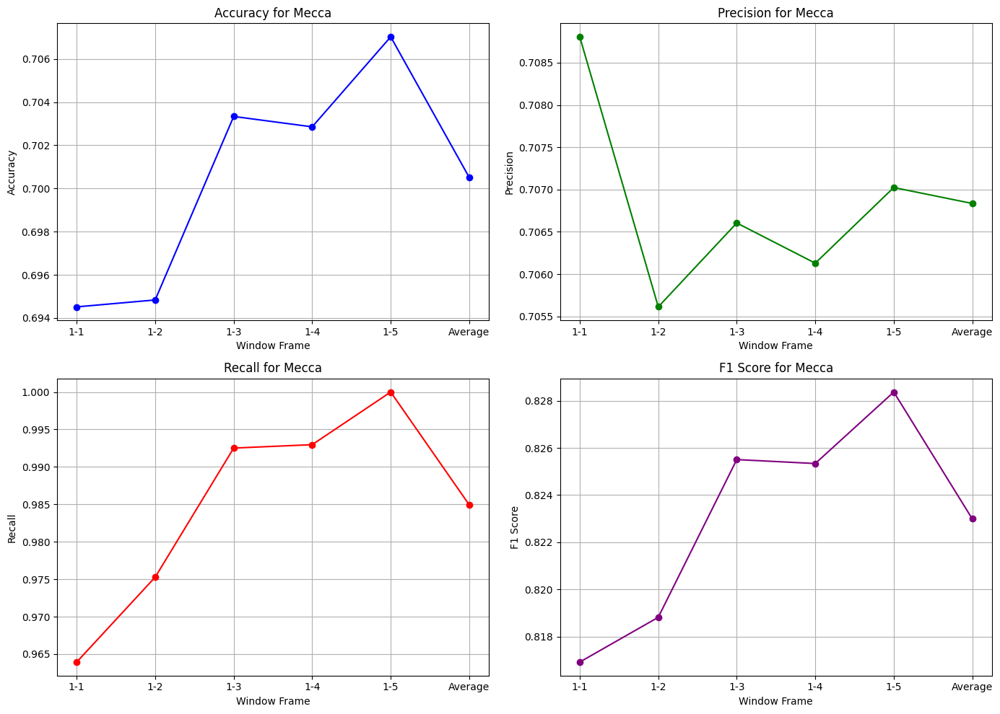

Metrics plots for Mecca saved to: /content/drive/MyDrive/CSE498R/dataset with frames of VCA/metrics_plots_for_mecca.pdf


In [ ]:
# Plot the graphs for the metrics
fig, ax = plt.subplots(2, 2, figsize=(14, 10))

# Accuracy plot
ax[0, 0].plot(metrics_df['Window Frame'], metrics_df['Accuracy'], marker='o', color='blue', label='Accuracy')
ax[0, 0].set_title('Accuracy for Mecca')
ax[0, 0].set_xlabel('Window Frame')
ax[0, 0].set_ylabel('Accuracy')
ax[0, 0].grid(True)

# Precision plot
ax[0, 1].plot(metrics_df['Window Frame'], metrics_df['Precision'], marker='o', color='green', label='Precision')
ax[0, 1].set_title('Precision for Mecca')
ax[0, 1].set_xlabel('Window Frame')
ax[0, 1].set_ylabel('Precision')
ax[0, 1].grid(True)

# Recall plot
ax[1, 0].plot(metrics_df['Window Frame'], metrics_df['Recall'], marker='o', color='red', label='Recall')
ax[1, 0].set_title('Recall for Mecca')
ax[1, 0].set_xlabel('Window Frame')
ax[1, 0].set_ylabel('Recall')
ax[1, 0].grid(True)

# F1 Score plot
ax[1, 1].plot(metrics_df['Window Frame'], metrics_df['F1 Score'], marker='o', color='purple', label='F1 Score')
ax[1, 1].set_title('F1 Score for Mecca')
ax[1, 1].set_xlabel('Window Frame')
ax[1, 1].set_ylabel('F1 Score')
ax[1, 1].grid(True)

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the plot as a PDF
plot_file_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/metrics_plots_for_mecca.pdf'
plt.savefig(plot_file_path)

# Show the plot
plt.show()

# Inform the user that the plot has been saved
print(f'Metrics plots for Mecca saved to: {plot_file_path}')

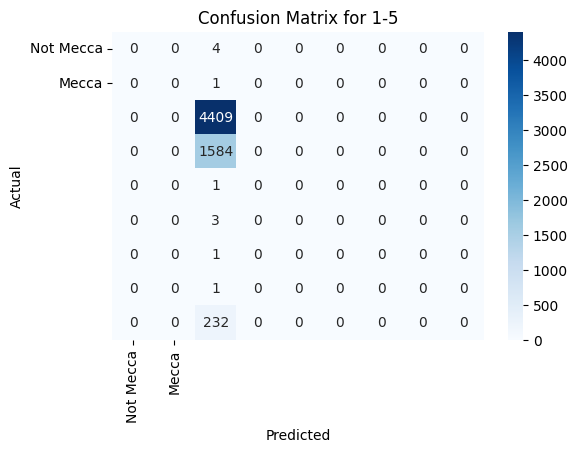

In [ ]:
cm = confusion_matrix(df['Actual Period'], df['Predicted Period'])

# Print confusion matrix with Seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Mecca', 'Mecca'], yticklabels=['Not Mecca', 'Mecca'])
plt.title(f'Confusion Matrix for {window_frame}')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


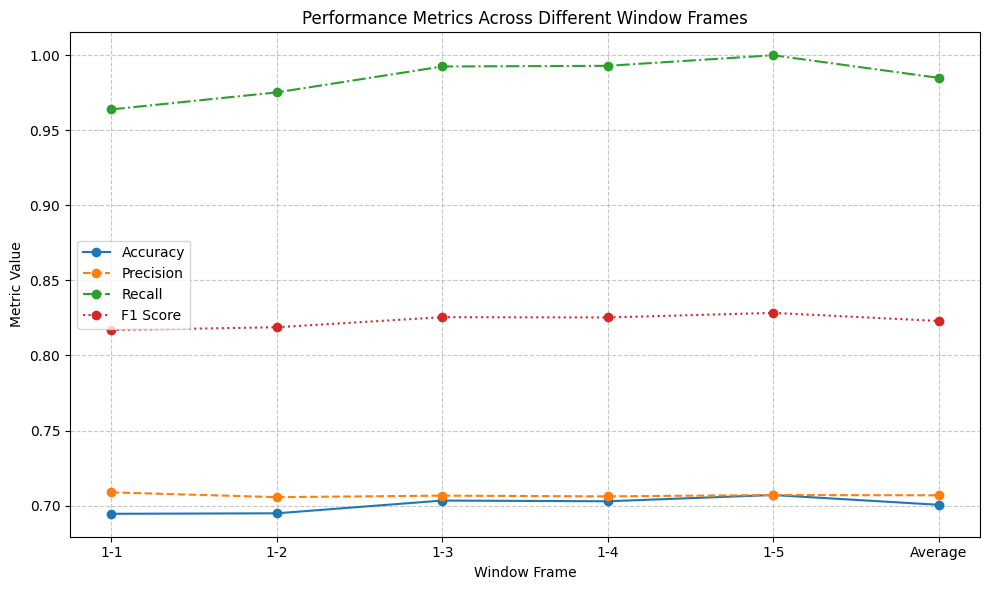

In [ ]:
# import matplotlib.pyplot as plt

# Extract data for plotting
window_frames = metrics_df['Window Frame']
accuracy = metrics_df['Accuracy']
precision = metrics_df['Precision']
recall = metrics_df['Recall']
f1_score = metrics_df['F1 Score']

# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Plot each metric
plt.plot(window_frames, accuracy, label='Accuracy', marker='o', linestyle='-')
plt.plot(window_frames, precision, label='Precision', marker='o', linestyle='--')
plt.plot(window_frames, recall, label='Recall', marker='o', linestyle='-.')
plt.plot(window_frames, f1_score, label='F1 Score', marker='o', linestyle=':')

# Add title and labels
plt.title('Performance Metrics Across Different Window Frames')
plt.xlabel('Window Frame')
plt.ylabel('Metric Value')

# Add legend
plt.legend()

# Display grid
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
from sklearn.metrics import recall_score, f1_score, accuracy_score

# List of window frames to evaluate
window_frames = ['1-1', '1-2', '1-3', '1-4', '1-5']
file_paths = [
    '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM1.xlsx',
    '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM2.xlsx',
    '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM3.xlsx',
    '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM4.xlsx',
    '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM5.xlsx'
]

# Initialize lists to store metrics for Medina
metrics_data_medina = []

def compute_metrics_medina(df):
    """
    Compute accuracy, precision, recall, and F1-score for Medina predictions.
    Precision for Medina is calculated as:
    Precision = (True Positives for Medina) / (True Positives for Medina + False Positives for Medina)
    """
    # Filter for Medina and Mecca only
    actual_medina = df['Actual Period'] == 'Medina'
    predicted_medina = df['Predicted Period'] == 'Medina'

    # Calculate True Positives (TP) for Medina and False Positives (FP) for Medina
    true_positive_medina = (actual_medina & predicted_medina).sum()
    false_positive_medina = (~actual_medina & predicted_medina).sum()
    false_negative_medina = (actual_medina & ~predicted_medina).sum()
    true_negative_medina = (~actual_medina & ~predicted_medina).sum()

    # Precision for Medina based on the custom formula
    precision_medina = true_positive_medina / (true_positive_medina + false_positive_medina) if (true_positive_medina + false_positive_medina) > 0 else 0

    # Recall for Medina (standard recall formula)
    recall_medina = recall_score(actual_medina, predicted_medina)

    # F1 score for Medina (standard F1 score formula)
    f1_medina = f1_score(actual_medina, predicted_medina)

    # Accuracy (standard accuracy formula)
    accuracy = accuracy_score(actual_medina, predicted_medina)

    return accuracy, precision_medina, recall_medina, f1_medina

# Loop through each window frame and compute metrics for Medina
for file_path, window_frame in zip(file_paths, window_frames):
    # Load the DataFrame
    df = pd.read_excel(file_path)

    # Calculate metrics for Medina
    accuracy, precision, recall, f1 = compute_metrics_medina(df)

    # Append metrics to the list for Medina
    metrics_data_medina.append([window_frame, accuracy, precision, recall, f1])

# Create a DataFrame for the metrics for Medina
metrics_df_medina = pd.DataFrame(metrics_data_medina, columns=['Window Frame', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])

# Calculate averages for each metric
averages = metrics_df_medina[['Accuracy', 'Precision', 'Recall', 'F1 Score']].mean()

# Append the averages as a new row
averages_row = {'Window Frame': 'Average', **averages.to_dict()}
metrics_df_medina = pd.concat([metrics_df_medina, pd.DataFrame([averages_row])], ignore_index=True)

# Save the DataFrame to an Excel file
output_file_path_medina = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/metrics_results_for_medina.xlsx'
metrics_df_medina.to_excel(output_file_path_medina, index=False)

# Inform the user that the file has been saved
print(f'Metrics table for Medina saved to: {output_file_path_medina}')

Metrics table for Medina saved to: /content/drive/MyDrive/CSE498R/dataset with frames of VCA/metrics_results_for_medina.xlsx


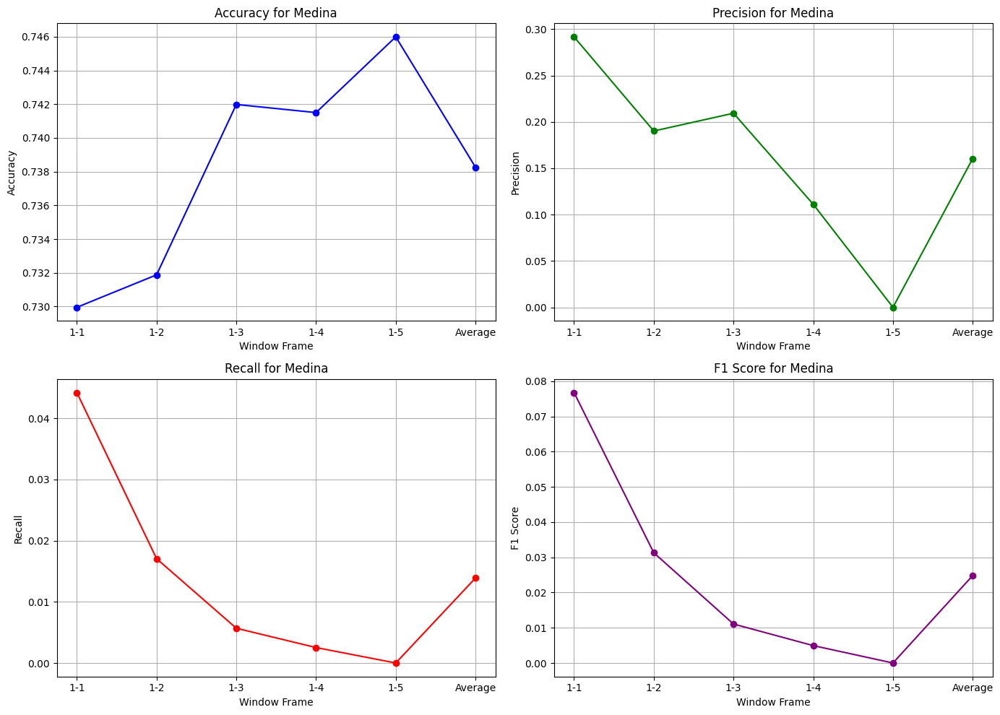

Metrics plots for Medina saved to: /content/drive/MyDrive/CSE498R/dataset with frames of VCA/metrics_plots_for_medina.pdf


In [ ]:
# Plot the graphs for the metrics
fig, ax = plt.subplots(2, 2, figsize=(14, 10))

# Accuracy plot
ax[0, 0].plot(metrics_df_medina['Window Frame'], metrics_df_medina['Accuracy'], marker='o', color='blue', label='Accuracy')
ax[0, 0].set_title('Accuracy for Medina')
ax[0, 0].set_xlabel('Window Frame')
ax[0, 0].set_ylabel('Accuracy')
ax[0, 0].grid(True)

# Precision plot
ax[0, 1].plot(metrics_df_medina['Window Frame'], metrics_df_medina['Precision'], marker='o', color='green', label='Precision')
ax[0, 1].set_title('Precision for Medina')
ax[0, 1].set_xlabel('Window Frame')
ax[0, 1].set_ylabel('Precision')
ax[0, 1].grid(True)

# Recall plot
ax[1, 0].plot(metrics_df_medina['Window Frame'], metrics_df_medina['Recall'], marker='o', color='red', label='Recall')
ax[1, 0].set_title('Recall for Medina')
ax[1, 0].set_xlabel('Window Frame')
ax[1, 0].set_ylabel('Recall')
ax[1, 0].grid(True)

# F1 Score plot
ax[1, 1].plot(metrics_df_medina['Window Frame'], metrics_df_medina['F1 Score'], marker='o', color='purple', label='F1 Score')
ax[1, 1].set_title('F1 Score for Medina')
ax[1, 1].set_xlabel('Window Frame')
ax[1, 1].set_ylabel('F1 Score')
ax[1, 1].grid(True)

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the plot as a PDF
plot_file_path = '/content/drive/MyDrive/CSE498R/dataset with frames of VCA/metrics_plots_for_medina.pdf'
plt.savefig(plot_file_path)

# Show the plot
plt.show()

# Inform the user that the plot has been saved
print(f'Metrics plots for Medina saved to: {plot_file_path}')

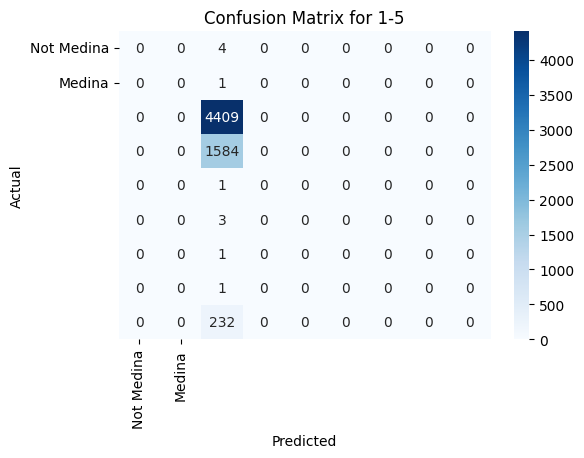

In [ ]:
cm = confusion_matrix(df['Actual Period'], df['Predicted Period'])
# Print confusion matrix with Seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Medina', 'Medina'], yticklabels=['Not Medina', 'Medina'])
plt.title(f'Confusion Matrix for {window_frame}')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

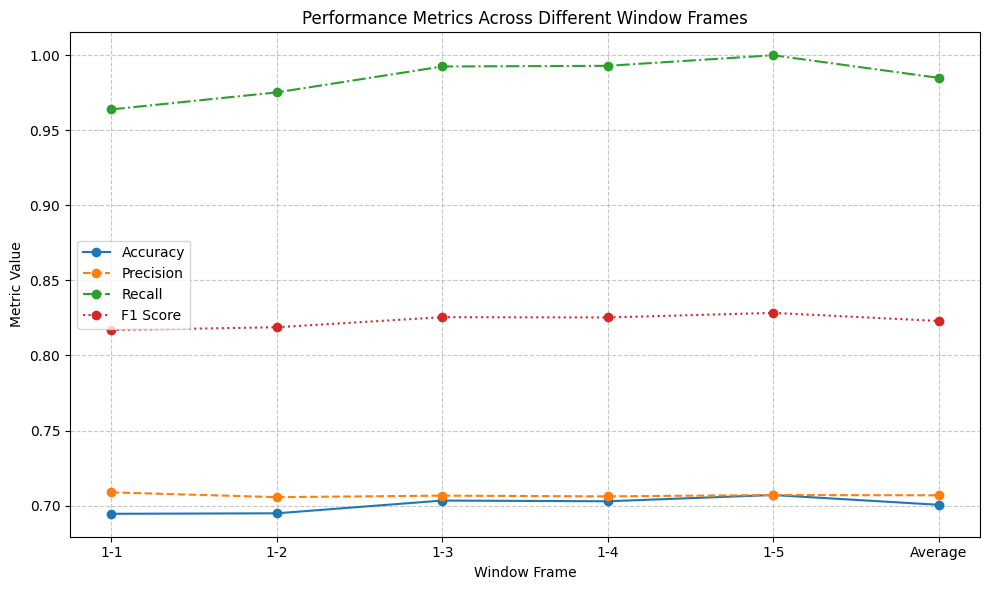

In [ ]:
# import matplotlib.pyplot as plt

# Extract data for plotting
window_frames = metrics_df['Window Frame']
accuracy = metrics_df['Accuracy']
precision = metrics_df['Precision']
recall = metrics_df['Recall']
f1_score = metrics_df['F1 Score']

# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Plot each metric
plt.plot(window_frames, accuracy, label='Accuracy', marker='o', linestyle='-')
plt.plot(window_frames, precision, label='Precision', marker='o', linestyle='--')
plt.plot(window_frames, recall, label='Recall', marker='o', linestyle='-.')
plt.plot(window_frames, f1_score, label='F1 Score', marker='o', linestyle=':')

# Add title and labels
plt.title('Performance Metrics Across Different Window Frames')
plt.xlabel('Window Frame')
plt.ylabel('Metric Value')

# Add legend
plt.legend()

# Display grid
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

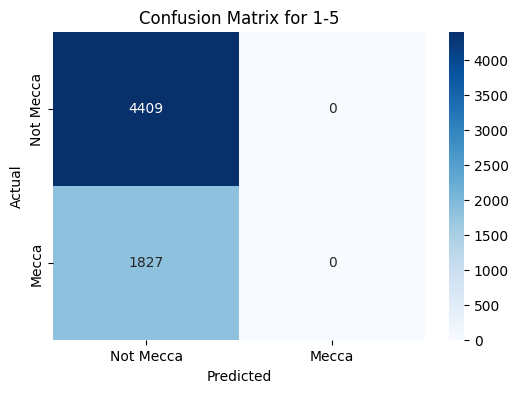

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


# Assuming 'df' is your DataFrame containing 'Actual Period' and 'Predicted Period'
# Replace this with the correct DataFrame name or filtering if necessary
df = pd.read_excel('/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM5.xlsx')  # Example: Using the last file in your file_paths

# Filter for Mecca and Medina only (replace 'Actual Period' and 'Predicted Period' with your actual column names)
actual = df['Actual Period'].apply(lambda x: 'Mecca' if x == 'Mecca' else 'Not Mecca')
predicted = df['Predicted Period'].apply(lambda x: 'Mecca' if x == 'Mecca' else 'Not Mecca')

# Calculate the confusion matrix
cm = confusion_matrix(actual, predicted)

# Print confusion matrix with Seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Mecca', 'Mecca'], yticklabels=['Not Mecca', 'Mecca'])
plt.title(f'Confusion Matrix for {window_frame}')  # Make sure window_frame is defined and available
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

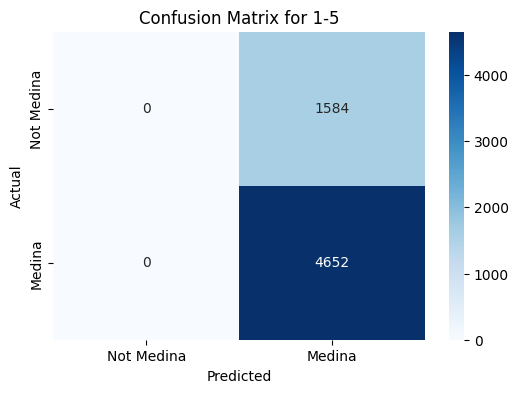

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


# Assuming 'df' is your DataFrame containing 'Actual Period' and 'Predicted Period'
# Replace this with the correct DataFrame name or filtering if necessary
df = pd.read_excel('/content/drive/MyDrive/CSE498R/dataset with frames of VCA/DFM5.xlsx')  # Example: Using the last file in your file_paths

# Filter for Mecca and Medina only (replace 'Actual Period' and 'Predicted Period' with your actual column names)
actual = df['Actual Period'].apply(lambda x: 'Medina' if x == 'Medina' else 'Not Medina')
predicted = df['Predicted Period'].apply(lambda x: 'Medina' if x == 'Medina' else 'Not Medina')

# Calculate the confusion matrix
cm = confusion_matrix(actual, predicted)

# Print confusion matrix with Seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Medina', 'Medina'], yticklabels=['Not Medina', 'Medina'])
plt.title(f'Confusion Matrix for {window_frame}')  # Make sure window_frame is defined and available
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()